In [5]:
# libs
%pip install seaborn pandas numpy matplotlib wordcloud surprise

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.4-cp310-cp310-linux_x86_64.whl size=2357271 sha256=e1de11a79d5016b2ba209378813b92c84b9b2c63a27038690e63aa15f9199ca6
  Stored in directory: /root/.cache/pip/wheels/4b/3f/df/6acbf0a40397d9bf3ff97f582cc22fb9ce66adde75bc71fd54
Successfully built scikit-surprise


In [2]:
# imports
import pandas as pd
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.io as pio
import numpy as np
import math
import re
from collections import Counter
import datetime

In [3]:
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [4]:
from collections import Counter

In [ ]:
movies = pd.read_csv('movies.csv')
ratings = pd.read_csv('ratings.csv')
tags = pd.read_csv('tags.csv')
links = pd.read_csv('links.csv')

In [ ]:
print(movies.shape)
print(ratings.shape)
print(tags.shape)
print(links.shape)

(9125, 3)
(100004, 4)
(1296, 4)
(9125, 3)


# Observe Data

In [ ]:
movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [ ]:
ratings.head()

,userId,movieId,rating,timestamp
0,1,31,2.5,1260759144
1,1,1029,3.0,1260759179
2,1,1061,3.0,1260759182
3,1,1129,2.0,1260759185
4,1,1172,4.0,1260759205


In [ ]:
tags.head()

,userId,movieId,tag,timestamp
0,15,339,sandra 'boring' bullock,1138537770
1,15,1955,dentist,1193435061
2,15,7478,Cambodia,1170560997
3,15,32892,Russian,1170626366
4,15,34162,forgettable,1141391765


In [ ]:
links.head()

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [ ]:
movies.dtypes

movieId     int64
title      object
genres     object
dtype: object

In [ ]:
ratings.dtypes

userId         int64
movieId        int64
rating       float64
timestamp      int64
dtype: object

In [ ]:
tags.dtypes

userId        int64
movieId       int64
tag          object
timestamp     int64
dtype: object

In [ ]:
links.dtypes

movieId      int64
imdbId       int64
tmdbId     float64
dtype: object

In [ ]:
for col in movies:
  print(f'{col} >>> {movies[col].nunique()}')

movieId >>> 9125
title >>> 9123
genres >>> 902


In [ ]:
for col in ratings:
  print(f'{col} >>> {ratings[col].nunique()}')

userId >>> 671
movieId >>> 9066
rating >>> 10
timestamp >>> 78141


In [ ]:
for col in tags:
  print(f'{col} >>> {tags[col].nunique()}')

userId >>> 61
movieId >>> 689
tag >>> 582
timestamp >>> 1245


In [ ]:
for col in links:
  print(f'{col} >>> {links[col].nunique()}')

movieId >>> 9125
imdbId >>> 9125
tmdbId >>> 9112


# Merge Data

In [ ]:
tags = tags.drop(columns='timestamp')

In [ ]:
# merge files into 1
all = ratings.merge(movies, on="movieId", how='left')
all = all.merge(links, on="movieId", how='left')
all = all.merge(tags, on=['userId', 'movieId'], how='left')
all.count()

userId       100441
movieId      100441
rating       100441
timestamp    100441
title        100441
genres       100441
imdbId       100441
tmdbId       100370
tag             939
dtype: int64

In [ ]:
all.head()

,userId,movieId,rating,timestamp,title,genres,imdbId,tmdbId,tag
0,1,31,2.5,1260759144,Dangerous Minds (1995),Drama,112792,9909.0,NaN
1,1,1029,3.0,1260759179,Dumbo (1941),Animation|Children|Drama|Musical,33563,11360.0,NaN
2,1,1061,3.0,1260759182,Sleepers (1996),Thriller,117665,819.0,NaN
3,1,1129,2.0,1260759185,Escape from New York (1981),Action|Adventure|Sci-Fi|Thriller,82340,1103.0,NaN
4,1,1172,4.0,1260759205,Cinema Paradiso (Nuovo cinema Paradiso) (1989),Drama,95765,11216.0,NaN


In [ ]:
all.shape

(100441, 9)

# Convert Timestamp

We do this as a first step so that the statistics we give are clearer.

In [ ]:
all['timestamp'] = pd.to_datetime(all['timestamp'], unit='s')
all.head()

,userId,movieId,rating,timestamp,title,genres,imdbId,tmdbId,tag
0,1,31,2.5,2009-12-14 02:52:24,Dangerous Minds (1995),Drama,112792,9909.0,NaN
1,1,1029,3.0,2009-12-14 02:52:59,Dumbo (1941),Animation|Children|Drama|Musical,33563,11360.0,NaN
2,1,1061,3.0,2009-12-14 02:53:02,Sleepers (1996),Thriller,117665,819.0,NaN
3,1,1129,2.0,2009-12-14 02:53:05,Escape from New York (1981),Action|Adventure|Sci-Fi|Thriller,82340,1103.0,NaN
4,1,1172,4.0,2009-12-14 02:53:25,Cinema Paradiso (Nuovo cinema Paradiso) (1989),Drama,95765,11216.0,NaN


In [ ]:
all.dtypes

userId                int64
movieId               int64
rating              float64
timestamp    datetime64[ns]
title                object
genres               object
imdbId                int64
tmdbId              float64
tag                  object
dtype: object

# Get Statistics

The statistics obtained in this part are the ones that are included in the report, since we care about the number of unique values as well as the number of NaN values, and the unmerged files contain duplicates between each other.

In [ ]:
for col in all:
  print(f'{col} >>> {all[col].nunique()}')
  if all[col].dtype in [int, float, bool] or col == 'timestamp':
    print(f'max >>> {all[col].max()}')
    print(f'min >>> {all[col].min()}')
  print('---------------------------')

userId >>> 671
max >>> 671
min >>> 1
---------------------------
movieId >>> 9066
max >>> 163949
min >>> 1
---------------------------
rating >>> 10
max >>> 5.0
min >>> 0.5
---------------------------
timestamp >>> 78141
max >>> 2016-10-16 17:57:24
min >>> 1995-01-09 11:46:49
---------------------------
title >>> 9064
---------------------------
genres >>> 901
---------------------------
imdbId >>> 9066
max >>> 5794766
min >>> 417
---------------------------
tmdbId >>> 9053
max >>> 416437.0
min >>> 2.0
---------------------------
tag >>> 517
---------------------------


In [ ]:
all.isna().sum()

userId           0
movieId          0
rating           0
timestamp        0
title            0
genres           0
imdbId           0
tmdbId          71
tag          99502
dtype: int64

# Prepare Data for Visualizations

## Get Years

In [ ]:
# extract the year using regular expressions
all['year'] = all['title'].str.extract(r'(\d{4})\)$')

In [ ]:
all.head()

,userId,movieId,rating,timestamp,title,genres,imdbId,tmdbId,tag,year
0,1,31,2.5,2009-12-14 02:52:24,Dangerous Minds (1995),Drama,112792,9909.0,NaN,1995
1,1,1029,3.0,2009-12-14 02:52:59,Dumbo (1941),Animation|Children|Drama|Musical,33563,11360.0,NaN,1941
2,1,1061,3.0,2009-12-14 02:53:02,Sleepers (1996),Thriller,117665,819.0,NaN,1996
3,1,1129,2.0,2009-12-14 02:53:05,Escape from New York (1981),Action|Adventure|Sci-Fi|Thriller,82340,1103.0,NaN,1981
4,1,1172,4.0,2009-12-14 02:53:25,Cinema Paradiso (Nuovo cinema Paradiso) (1989),Drama,95765,11216.0,NaN,1989


In [ ]:
all['year'].nunique()

103

In [ ]:
all['year'].unique()

array(['1995', '1941', '1996', '1981', '1989', '1978', '1959', '1982',
       '1992', '1991', '1979', '1971', '1980', '1988', '1998', '1986',
       '1974', '1994', '1993', '1990', '1970', '1987', '1983', '1997',
       '1999', '1984', '2000', '2002', '2003', '2004', '2006', '2008',
       '2009', '1977', '1937', '1940', '1972', '1958', '1939', '1950',
       '1964', '1951', '1975', '1960', '1985', '1962', '1976', '1942',
       '1967', '1955', '1961', '1953', '1928', '1973', '1965', '2001',
       '2005', '1957', '1954', '1968', '1966', '2007', '2010', '2011',
       '2012', '2013', '1952', '1963', '1945', '1946', '1949', '1948',
       '1931', '1969', '1927', '1933', '1956', '1944', '1936', '1925',
       '1929', '1935', '2014', '2015', '2016', '1922', '1947', '1926',
       '1920', '1938', '1934', '1930', '1943', '1921', '1932', '1924',
       nan, '1915', '1902', '1923', '1918', '1917', '1916', '1919'],
      dtype=object)

## Get Genres

In [ ]:
one_hot_genres = all['genres'].str.get_dummies('|')

# add 'genre_' as a prefix to all column names
one_hot_genres = one_hot_genres.add_prefix('genre_')

all = pd.concat([all, one_hot_genres], axis=1)

In [ ]:
all.head()

,userId,movieId,rating,timestamp,title,genres,imdbId,tmdbId,tag,year,...,genre_Film-Noir,genre_Horror,genre_IMAX,genre_Musical,genre_Mystery,genre_Romance,genre_Sci-Fi,genre_Thriller,genre_War,genre_Western
0,1,31,2.5,2009-12-14 02:52:24,Dangerous Minds (1995),Drama,112792,9909.0,NaN,1995,...,0,0,0,0,0,0,0,0,0,0
1,1,1029,3.0,2009-12-14 02:52:59,Dumbo (1941),Animation|Children|Drama|Musical,33563,11360.0,NaN,1941,...,0,0,0,1,0,0,0,0,0,0
2,1,1061,3.0,2009-12-14 02:53:02,Sleepers (1996),Thriller,117665,819.0,NaN,1996,...,0,0,0,0,0,0,0,1,0,0
3,1,1129,2.0,2009-12-14 02:53:05,Escape from New York (1981),Action|Adventure|Sci-Fi|Thriller,82340,1103.0,NaN,1981,...,0,0,0,0,0,0,1,1,0,0
4,1,1172,4.0,2009-12-14 02:53:25,Cinema Paradiso (Nuovo cinema Paradiso) (1989),Drama,95765,11216.0,NaN,1989,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
all.shape

(100441, 30)

## Handle NaN Values

For our initial data analysis, we drop the NaN values for the genres (we drop the column "(no genres listed)", and the empty values in the newly created 'year' column, since they amount to 25 entries in total, which is only 0.025% of the whole data we have.

This way, we can create cleaner visualizations of the data.

In [ ]:
all.dtypes

userId                               int64
movieId                              int64
rating                             float64
timestamp                   datetime64[ns]
title                               object
genres                              object
imdbId                               int64
tmdbId                             float64
tag                                 object
year                                object
genre_(no genres listed)             int64
genre_Action                         int64
genre_Adventure                      int64
genre_Animation                      int64
genre_Children                       int64
genre_Comedy                         int64
genre_Crime                          int64
genre_Documentary                    int64
genre_Drama                          int64
genre_Fantasy                        int64
genre_Film-Noir                      int64
genre_Horror                         int64
genre_IMAX                           int64
genre_Music

In [ ]:
for col in all:
  print(f'{col} >>> {all[col].nunique()}')

userId >>> 671
movieId >>> 9066
rating >>> 10
timestamp >>> 78141
title >>> 9064
genres >>> 901
imdbId >>> 9066
tmdbId >>> 9053
tag >>> 517
year >>> 103
genre_(no genres listed) >>> 2
genre_Action >>> 2
genre_Adventure >>> 2
genre_Animation >>> 2
genre_Children >>> 2
genre_Comedy >>> 2
genre_Crime >>> 2
genre_Documentary >>> 2
genre_Drama >>> 2
genre_Fantasy >>> 2
genre_Film-Noir >>> 2
genre_Horror >>> 2
genre_IMAX >>> 2
genre_Musical >>> 2
genre_Mystery >>> 2
genre_Romance >>> 2
genre_Sci-Fi >>> 2
genre_Thriller >>> 2
genre_War >>> 2
genre_Western >>> 2


In [ ]:
all.isna().sum()

userId                          0
movieId                         0
rating                          0
timestamp                       0
title                           0
genres                          0
imdbId                          0
tmdbId                         71
tag                         99502
year                            9
genre_(no genres listed)        0
genre_Action                    0
genre_Adventure                 0
genre_Animation                 0
genre_Children                  0
genre_Comedy                    0
genre_Crime                     0
genre_Documentary               0
genre_Drama                     0
genre_Fantasy                   0
genre_Film-Noir                 0
genre_Horror                    0
genre_IMAX                      0
genre_Musical                   0
genre_Mystery                   0
genre_Romance                   0
genre_Sci-Fi                    0
genre_Thriller                  0
genre_War                       0
genre_Western 

In [ ]:
(all['genre_(no genres listed)'] == 1).sum()

18

In [ ]:
all = all[all['genre_(no genres listed)'] != 1]
(all['genre_(no genres listed)'] == 1).sum()

0

In [ ]:
all.shape

(100423, 30)

In [ ]:
all = all.drop(columns='genre_(no genres listed)')

In [ ]:
all.dropna(subset=['year'], inplace=True)

In [ ]:
# convert 'year' column to integer type
all['year'] = all['year'].astype(int)

In [ ]:
all.shape

(100416, 29)

## Standardize Text Data

In [ ]:
#standardize the data
def std_data(ldf):
  # remove special characters ' - ? *. ! () : ; |
  substring_to_remove = ['\-','\?','\*','\.', '\!', '\(', '\)', '\:', '\;']
  substring_special = ['\|']
  # and put everything in lowercase
  for column in ldf:
    if ldf[column].dtypes == object:
      ldf[column] = ldf[column].str.lower()
      ldf[column].replace('|'.join(substring_to_remove), '', regex=True, inplace=True)
      ldf[column].replace('|'.join(substring_special), ' ', regex=True, inplace=True)
std_data(all)

In [ ]:
def clean_data(df):
    df.drop_duplicates(inplace=True)
clean_data(all)

In [ ]:
all.shape

(100416, 29)

In [ ]:
all.head()

,userId,movieId,rating,timestamp,title,genres,imdbId,tmdbId,tag,year,...,genre_Film-Noir,genre_Horror,genre_IMAX,genre_Musical,genre_Mystery,genre_Romance,genre_Sci-Fi,genre_Thriller,genre_War,genre_Western
0,1,31,2.5,2009-12-14 02:52:24,dangerous minds 1995,drama,112792,9909.0,NaN,1995,...,0,0,0,0,0,0,0,0,0,0
1,1,1029,3.0,2009-12-14 02:52:59,dumbo 1941,animation children drama musical,33563,11360.0,NaN,1941,...,0,0,0,1,0,0,0,0,0,0
2,1,1061,3.0,2009-12-14 02:53:02,sleepers 1996,thriller,117665,819.0,NaN,1996,...,0,0,0,0,0,0,0,1,0,0
3,1,1129,2.0,2009-12-14 02:53:05,escape from new york 1981,action adventure scifi thriller,82340,1103.0,NaN,1981,...,0,0,0,0,0,0,1,1,0,0
4,1,1172,4.0,2009-12-14 02:53:25,cinema paradiso nuovo cinema paradiso 1989,drama,95765,11216.0,NaN,1989,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#all.to_csv('all.csv')

# Data Analysis

In [ ]:
purple_viridis = 'rgb(72, 40, 120)'
blue_viridis = 'rgb(38, 130, 142)'

## Movie

In [ ]:
# movie ratings distribution
# count the number of ratings per movie
movie_ratings_count = all['movieId'].value_counts().reset_index()
movie_ratings_count.columns = ['movieId', 'ratings_count']

# count the number of movies for each ratings count
movies_per_ratings_count = movie_ratings_count['ratings_count'].value_counts().reset_index()
movies_per_ratings_count.columns = ['ratings_count', 'movies_count']
movies_per_ratings_count = movies_per_ratings_count.sort_values('ratings_count')

# calculate the percentage of movies for each ratings count
total_movies = movies_per_ratings_count['movies_count'].sum()
movies_per_ratings_count['percentage'] = (movies_per_ratings_count['movies_count'] / total_movies) * 100

# group movies into bins based on the ratings count
bins = range(0, 350, 50)
labels = [f"{bin_start}-{bin_start+49}" for bin_start in bins[:-1]]
movies_per_ratings_count['bin'] = pd.cut(movies_per_ratings_count['ratings_count'], bins=bins, labels=labels, include_lowest=True)

# count the number of movies in each bin
movies_per_bin = movies_per_ratings_count.groupby('bin')['movies_count'].sum().reset_index()

# plot
fig = px.bar(movies_per_bin, x='bin', y='movies_count', labels={'bin': 'Number of Ratings', 'movies_count': 'Number of Movies'},
             title='Number of Movies by Ratings Count', color_discrete_sequence=[purple_viridis])
fig.update_xaxes(tickangle=45)
fig.show()

In [ ]:
print(movies_per_bin)

       bin  movies_count
0     0-49          8597
1    50-99           296
2  100-149            97
3  150-199            28
4  200-249            17
5  250-299             3


## User

In [ ]:
# user ratings distribution
# count the number of ratings per user
user_ratings_count = all['userId'].value_counts().reset_index()
user_ratings_count.columns = ['userId', 'ratings_count']

# count the number of users for each ratings count
users_per_ratings_count = user_ratings_count['ratings_count'].value_counts().reset_index()
users_per_ratings_count.columns = ['ratings_count', 'users_count']
users_per_ratings_count = users_per_ratings_count.sort_values('ratings_count')

# calculate the percentage of users for each ratings count
total_users = users_per_ratings_count['users_count'].sum()
users_per_ratings_count['percentage'] = (users_per_ratings_count['users_count'] / total_users) * 100

# group users into bins based on the ratings count
bins = range(0, 1900, 50)
labels = [f"{bin_start}-{bin_start+49}" for bin_start in bins[:-1]]
users_per_ratings_count['bin'] = pd.cut(users_per_ratings_count['ratings_count'], bins=bins, labels=labels, include_lowest=True)

# count the number of users in each bin
users_per_bin = users_per_ratings_count.groupby('bin')['users_count'].sum().reset_index()

# plot
fig = px.bar(users_per_bin, x='bin', y='users_count', labels={'bin': 'Number of Ratings', 'users_count': 'Number of Users'},
             title='Number of Users by Ratings Count', color_discrete_sequence=[purple_viridis])
fig.update_xaxes(tickangle=45)
fig.show()

In [ ]:
print(users_per_bin)

          bin  users_count
0        0-49          249
1       50-99          162
2     100-149           80
3     150-199           43
4     200-249           33
5     250-299           25
6     300-349           18
7     350-399           10
8     400-449            9
9     450-499            5
10    500-549            7
11    550-599            0
12    600-649            5
13    650-699            5
14    700-749            3
15    750-799            1
16    800-849            1
17    850-899            0
18    900-949            5
19    950-999            0
20  1000-1049            2
21  1050-1099            1
22  1100-1149            0
23  1150-1199            0
24  1200-1249            0
25  1250-1299            1
26  1300-1349            1
27  1350-1399            0
28  1400-1449            0
29  1450-1499            0
30  1500-1549            0
31  1550-1599            0
32  1600-1649            1
33  1650-1699            0
34  1700-1749            2
35  1750-1799            0
3

## Rating

In [ ]:
# distribution of ratings
ratings = all['rating']
rating_counts = ratings.value_counts()
rating_percentages = rating_counts / len(ratings) * 100

trace = go.Bar(
    x=rating_counts.index,
    y=rating_counts,
    marker=dict(color=rating_counts, colorscale='Viridis'),
    text=rating_percentages.round(2).astype(str) + '%',
    textposition='auto',
)

layout = go.Layout(
    title='Distribution of Ratings',
    xaxis=dict(title='Rating'),
    yaxis=dict(title='Count'),
    bargap=0.2,
)

fig = go.Figure(data=[trace], layout=layout)

fig.show()

## Title

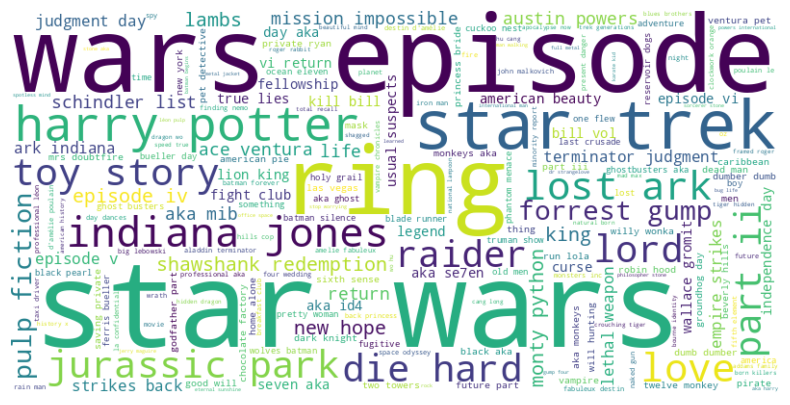

In [ ]:
unique_movies = all.drop_duplicates(subset=['userId', 'movieId'])
titles = unique_movies['title'].dropna()

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(' '.join(titles))

plt.figure(figsize=(10, 5))
plt.axis('off')
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

## Release Year

In [ ]:
min_year = min(all['year'].unique())
max_year = max(all['year'].unique())
print("Oldest year:", min_year)
print("Newest year:", max_year)

Oldest year: 1902
Newest year: 2016


In [ ]:
print((all['year'] == min_year).sum())
print((all['year'] == max_year).sum())

6
123


In [ ]:
print(all[(all['year'] == min_year)].head(1))

       userId  movieId  rating           timestamp  \
36588     262    32898     3.0 2015-06-10 12:29:50   

                                                  title  \
36588  trip to the moon, a voyage dans la lune, le 1902   

                               genres  imdbId  tmdbId  tag  year  ...  \
36588  action adventure fantasy scifi     417   775.0  NaN  1902  ...   

       genre_Film-Noir  genre_Horror  genre_IMAX  genre_Musical  \
36588                0             0           0              0   

       genre_Mystery  genre_Romance  genre_Sci-Fi  genre_Thriller  genre_War  \
36588              0              0             1               0          0   

       genre_Western  
36588              0  

[1 rows x 29 columns]


In [ ]:
# ratings per movie release year distribution
ratings_per_year = all['year'].value_counts().sort_index()
ratings_per_year = ratings_per_year.reset_index()
ratings_per_year.columns = ['year', 'count']

fig = px.line(ratings_per_year, x='year', y='count',
              title='Number of Ratings per Movie Release Year',
              labels={'year': 'Release Year', 'count': 'Number of Ratings'},
              color_discrete_sequence=[purple_viridis])

fig.update_layout(xaxis={'type': 'category'})
fig.show()

In [ ]:
# average rating per movie release year
average_rating_per_year = all.groupby('year')['rating'].mean().reset_index()

fig = px.line(average_rating_per_year, x='year', y='rating',
              title='Average Rating per Movie Release Year',
              labels={'year': 'Release Year', 'rating': 'Average Rating'},
              color_discrete_sequence=[purple_viridis])
fig.show()

In [ ]:
# average movie production year each user is interested in
grouped_data = all.groupby('userId')['year'].mean().reset_index()

fig = px.scatter(grouped_data, x='year', y='userId')

fig.update_traces(marker=dict(color=purple_viridis), selector=dict(type='scatter'))
fig.update_layout(
    title='Relationship Between User and Release Year',
    xaxis_title='Average Movie Release Year',
    yaxis_title='User ID',
)

fig.show()

In [ ]:
# statistics of rating per movie release year
px.box(all, y='year', x='rating',
       title='Statistics of Ratings per Release Year',
       color_discrete_sequence=[purple_viridis])

## Genres

In [ ]:
genre_columns = ['genre_Action', 'genre_Adventure', 'genre_Animation', 'genre_Children', 'genre_Comedy',
                  'genre_Crime', 'genre_Documentary', 'genre_Drama', 'genre_Fantasy', 'genre_Film-Noir',
                  'genre_Horror', 'genre_IMAX', 'genre_Musical', 'genre_Mystery', 'genre_Romance',
                  'genre_Sci-Fi', 'genre_Thriller', 'genre_War', 'genre_Western']

In [ ]:
# distribution of genres
genre_counts = all[genre_columns].sum()
genre_counts_sorted = genre_counts.sort_values(ascending=False)
genre_labels = genre_counts_sorted.index.str.replace('genre_', '')

# percentage of occurrence, the percentages will sum up to more than a 100
# since several genres can occur together
total_entries = 100416
genre_percentages = (genre_counts_sorted / total_entries) * 100

trace = go.Bar(
    x=genre_labels,
    y=genre_counts_sorted,
    marker=dict(color=genre_counts_sorted, colorscale='Viridis'),
    text=genre_percentages.round(2).astype(str) + '%',
    textposition='auto',
)

layout = go.Layout(
    title='Distribution of Genres',
    xaxis=dict(title='Genre', tickangle=-45),
    yaxis=dict(title='Count of Occurrence'),
    xaxis_tickangle=-45,
)

fig = go.Figure(data=[trace], layout=layout)

fig.show()

In [ ]:
# average rating per genre
genres = ['Action', 'Adventure', 'Animation', 'Children', 'Comedy', 'Crime', 'Documentary',
          'Drama', 'Fantasy', 'Film-Noir', 'Horror', 'IMAX', 'Musical', 'Mystery', 'Romance',
          'Sci-Fi', 'Thriller', 'War', 'Western']
average_ratings = [all[all[f'genre_{genre}'] == 1]['rating'].mean() for genre in genres]

average_ratings, genres = zip(*sorted(zip(average_ratings, genres), reverse=True))

average_rounded = []
for rating in average_ratings:
  average_rounded.append(rating.round(2))

trace = go.Bar(
    x=genres,
    y=average_ratings,
    marker=dict(color=average_ratings, colorscale='Viridis'),
    text=average_rounded
)

layout = go.Layout(
    title='Average Rating per Genre',
    xaxis=dict(title='Genre', tickangle=-45),
    yaxis=dict(title='Average Rating')
)

fig = go.Figure(data=[trace], layout=layout)

fig.show()

In [ ]:
# genre occurrence distributions in each year
# we drop duplicate movies since we are only interested in unique movies

unique_movies = all.drop_duplicates(subset=['userId', 'movieId'])
genre_counts = unique_movies.groupby('year')[genre_columns].sum()
genre_percentages = genre_counts.div(genre_counts.sum(axis=1), axis=0) * 100

genre_percentages['YearGroup'] = (genre_percentages.index - 1) // 10 * 10

table = pd.pivot_table(genre_percentages, index='YearGroup', values=genre_percentages.columns)

table.columns = table.columns.str.replace('genre_', '')

text_labels = []
for i, row in enumerate(table.values):
    text_labels.append([f'{value:.1f}%' for value in row])

fig = go.Figure(data=go.Heatmap(z=table.values,
                               x=table.columns,
                               y=table.index,
                               colorscale='Viridis',
                               text=text_labels,
                               hoverinfo='text'))

fig.update_layout(title='Genre Occurrence by Year Group',
                  xaxis_title='Genre',
                  yaxis_title='Year Group')

fig.update_traces(textfont=dict(size=12))
for i, row in enumerate(table.index):
    for j, col in enumerate(table.columns):
        fig.add_annotation(x=col, y=row, text=text_labels[i][j],
                           showarrow=False, font=dict(color='white', size=12))

fig.show()

In [ ]:
# correlation of genres
genre_data = all[genre_columns]

# correlation matrix
genre_correlation = genre_data.corr().round(2)

genre_labels = [col.replace('genre_', '') for col in genre_columns]

fig = ff.create_annotated_heatmap(z=np.array(genre_correlation),
                                  x=genre_labels,
                                  y=genre_labels,
                                  colorscale='Viridis')
fig.update_layout(
    title='Genre Correlation Heatmap',
    xaxis=dict(title='Genres', tickangle=-45),
    yaxis=dict(title='Genres'),
    height=1000,
    width=1200,
    margin=dict(l=200, r=200, t=100, b=100),
)
fig.update_annotations(font=dict(size=10, color='white'))

fig.show()

In [ ]:
# occurrence of each genre throughout the years
# again we are interested in the unique movies
unique_movies = all.drop_duplicates(subset=['userId', 'movieId'])

genre_counts = unique_movies.groupby('year')[genre_columns].sum()
genre_percentages = genre_counts.div(genre_counts.sum(axis=1), axis=0) * 100

# create a separate plot for each genre
for column in genre_percentages.columns:
    genre_name = column.replace('genre_', '')
    genre_plot = go.Figure()
    genre_plot.add_trace(go.Scatter(x=genre_percentages.index, y=genre_percentages[column], mode='lines+markers', marker=dict(color=purple_viridis)))
    genre_plot.update_layout(title=f'Occurrence of {genre_name} throughout the Release Years (Percentage)',
                             xaxis_title='Release Year', yaxis_title='Percentage')
    genre_plot.show()


## Time

In [ ]:
# create timestamp components
all['timestamp_year'] = all['timestamp'].dt.year
all['timestamp_month'] = all['timestamp'].dt.strftime('%B')
all['timestamp_day'] = all['timestamp'].dt.day
all['timestamp_hour_of_day'] = all['timestamp'].dt.hour

In [ ]:
# get the distributions
yearly_rating_count = all.groupby('timestamp_year')['rating'].count().reset_index()
monthly_rating_count = all.groupby('timestamp_month')['rating'].count().reset_index()
daily_rating_count = all.groupby('timestamp_day')['rating'].count().reset_index()
hourly_rating_count = all.groupby('timestamp_hour_of_day')['rating'].count().reset_index()

In [ ]:
# get the average ratings
yearly_average_rating = all.groupby('timestamp_year')['rating'].mean().reset_index()
monthly_average_rating = all.groupby('timestamp_month')['rating'].mean().reset_index()
daily_average_rating = all.groupby('timestamp_day')['rating'].mean().reset_index()
hourly_average_rating = all.groupby('timestamp_hour_of_day')['rating'].mean().reset_index()

### Distributions

In [ ]:
# year
fig = px.bar(yearly_rating_count, x='timestamp_year', y='rating', color_discrete_sequence=[purple_viridis])

fig.update_traces(texttemplate='%{y}', textposition='outside')
fig.update_layout(
    title='Yearly Ratings Distribution',
    xaxis_title='Year',
    yaxis_title='Rating Count',
    template='plotly_white'
)

fig.show()

In [ ]:
# month
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
monthly_rating_count['timestamp_month'] = pd.Categorical(monthly_rating_count['timestamp_month'], categories=month_order, ordered=True)
monthly_rating_count.sort_values('timestamp_month', inplace=True)

fig = px.bar(monthly_rating_count, x='timestamp_month', y='rating', color_discrete_sequence=[purple_viridis])

fig.update_traces(texttemplate='%{y}', textposition='outside')
fig.update_layout(
    title='Monthly Ratings Distribution',
    xaxis_title='Month',
    yaxis_title='Rating Count',
    template='plotly_white'
)

fig.show()

In [ ]:
# day of month
fig = px.bar(daily_rating_count, x='timestamp_day', y='rating', color_discrete_sequence=[purple_viridis])

fig.update_traces(texttemplate='%{y}', textposition='outside')
fig.update_layout(
    title='Daily Ratings Distribution',
    xaxis_title='Day of the Month',
    yaxis_title='Rating Count',
    template='plotly_white'
)

fig.show()

In [ ]:
# hour of day
fig = px.bar(hourly_rating_count, x='timestamp_hour_of_day', y='rating', color_discrete_sequence=[purple_viridis])

fig.update_traces(texttemplate='%{y}', textposition='outside')
fig.update_layout(
    title='Hourly Ratings Distribution',
    xaxis_title='Hour of the Day',
    yaxis_title='Rating Count',
    template='plotly_white'
)

fig.show()

### Average Ratings

In [ ]:
# year
fig = px.line(yearly_average_rating, x='timestamp_year', y='rating', color_discrete_sequence=[purple_viridis])

fig.update_layout(
    title='Yearly Average Ratings',
    xaxis_title='Year',
    yaxis_title='Average Rating',
    template='plotly_white'
)

fig.show()

In [ ]:
# month
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
monthly_average_rating['timestamp_month'] = pd.Categorical(monthly_average_rating['timestamp_month'], categories=month_order, ordered=True)
monthly_average_rating.sort_values('timestamp_month', inplace=True)

fig = px.line(monthly_average_rating, x='timestamp_month', y='rating', color_discrete_sequence=[purple_viridis])

fig.update_layout(
    title='Monthly Average Ratings',
    xaxis_title='Month',
    yaxis_title='Average Rating',
    template='plotly_white'
)

fig.show()

In [ ]:
# day of month
fig = px.line(daily_average_rating, x='timestamp_day', y='rating', color_discrete_sequence=[purple_viridis])

fig.update_layout(
    title='Daily Average Ratings',
    xaxis_title='Day of the Month',
    yaxis_title='Average Rating',
    template='plotly_white'
)

fig.show()

In [ ]:
# hour of day
fig = px.line(hourly_average_rating, x='timestamp_hour_of_day', y='rating', color_discrete_sequence=[purple_viridis])

fig.update_layout(
    title='Hourly Average Ratings',
    xaxis_title='Hour of the Day',
    yaxis_title='Average Rating',
    template='plotly_white'
)

fig.show()

## Tag

In [ ]:
num_users_with_tags = all[all['tag'].notnull()]['userId'].nunique()
print("Number of users with tags:", num_users_with_tags)

Number of users with tags: 51


In [ ]:
user_tag_counts = all.groupby('userId')['tag'].count()
user_tag_counts = user_tag_counts[user_tag_counts > 0]
user_ratings_with_tags = all[all['tag'].notnull()].groupby('userId')['rating'].mean()

user_data = pd.DataFrame({'AverageRating': user_ratings_with_tags, 'TagCount': user_tag_counts})
user_data.reset_index(inplace=True)

user_rating_counts = all.groupby('userId')['rating'].count()
user_data['TotalRatings'] = user_rating_counts

user_data_sorted = user_data.sort_values(by='TagCount', ascending=False)
print("User data including average rating, tag count, and total ratings (sorted by TagCount in descending order):")
print(user_data_sorted)

User data including average rating, tag count, and total ratings (sorted by TagCount in descending order):
    userId  AverageRating  TagCount  TotalRatings
43     547       4.209770       174         110.0
24     364       3.684375       160          21.0
13     212       3.330097       103          53.0
41     531       3.702532        79         199.0
28     431       3.688312        77          50.0
27     423       4.862745        51          23.0
21     346       3.642857        42         162.0
8      138       4.837500        40         116.0
37     501       4.985714        35          32.0
35     480       4.346154        13          20.0
19     297       2.769231        13         423.0
32     456       4.500000        12          48.0
3       73       3.500000         9          51.0
17     277       4.055556         9         363.0
0       15       2.555556         9           NaN
34     478       5.000000         8         187.0
29     446       4.416667         6        

Most of the users rarely put tags, and even when they do, it's a small percentage of the total ratings they provide.

There isn't a correlation between the number of tags and the average rating, since we observe no trend.

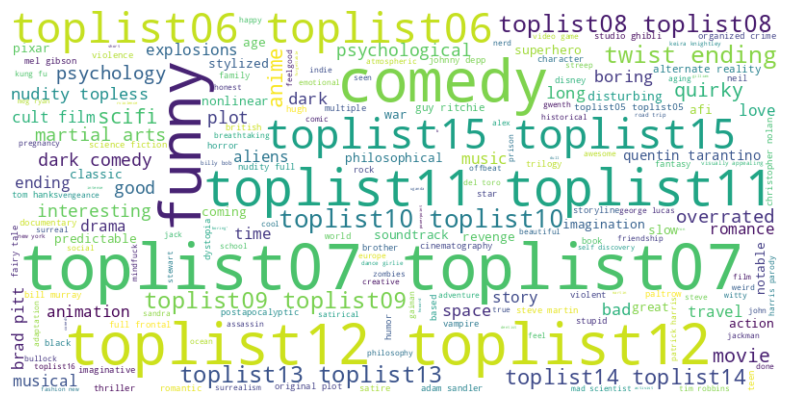

In [ ]:
# most frequently used words in tags overall
tags = all['tag'].dropna()

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(' '.join(tags))

plt.figure(figsize=(10, 5))
plt.axis('off')
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

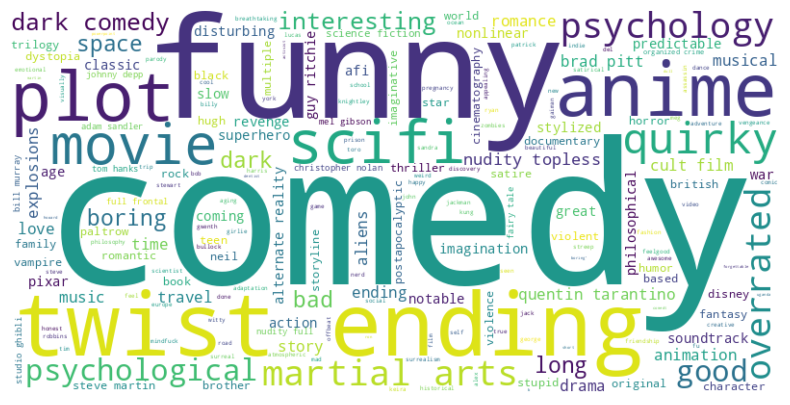

In [ ]:
# exclude tags that contain the word 'toplist'
tags = all.loc[~all['tag'].str.contains('toplist', na=False), 'tag'].dropna()

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(' '.join(tags))

plt.figure(figsize=(10, 5))
plt.axis('off')
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

In [ ]:
# most used tag keywords per rating
rating_tags = {}

for _, row in all.iterrows():
    rating = row['rating']
    tag = str(row['tag'])
    if rating not in rating_tags:
        rating_tags[rating] = ''
    rating_tags[rating] += tag + ' '

for rating, tags in rating_tags.items():
    print(f"Rating: {rating}")
    words = tags.split()
    word_counts = Counter(words)

    most_common_words = word_counts.most_common(10)

    for word, count in most_common_words:
        print(f"Word: {word}, Count: {count}")

    print('\n')

Rating: 2.5
Word: nan, Count: 4428
Word: plot, Count: 3
Word: comedy, Count: 2
Word: as, Count: 2
Word: nudity, Count: 2
Word: topless, Count: 2
Word: sandra, Count: 1
Word: 'boring', Count: 1
Word: bullock, Count: 1
Word: short, Count: 1


Rating: 3.0
Word: nan, Count: 20034
Word: good, Count: 3
Word: overrated, Count: 3
Word: the, Count: 2
Word: predictable, Count: 2
Word: powerpoint, Count: 1
Word: nicolas, Count: 1
Word: cage, Count: 1
Word: sexist, Count: 1
Word: amanda, Count: 1


Rating: 2.0
Word: nan, Count: 7244
Word: overrated, Count: 4
Word: bad, Count: 2
Word: adam, Count: 2
Word: sandler, Count: 2
Word: it, Count: 2
Word: stupid, Count: 2
Word: anime, Count: 2
Word: boring, Count: 2
Word: dull, Count: 1


Rating: 4.0
Word: nan, Count: 28596
Word: toplist07, Count: 11
Word: toplist11, Count: 11
Word: toplist12, Count: 11
Word: toplist09, Count: 10
Word: toplist10, Count: 10
Word: toplist15, Count: 9
Word: toplist14, Count: 8
Word: toplist06, Count: 7
Word: of, Count: 6


Ra

In [ ]:
# most used tag keywords per genre
genre_words = {}

for genre_column in genre_columns:
    genre_name = genre_column.split('_')[1]
    tags = ' '.join(all.loc[all[genre_column] == 1, 'tag'].dropna().values)
    tokens = word_tokenize(tags)
    freq_dist = FreqDist(tokens)
    genre_words[genre_name] = freq_dist.most_common(5)

for genre, words in genre_words.items():
    print(f"Genre: {genre}")
    print(words)
    print('---')

Genre: Action
[('martial', 8), ('arts', 8), ('scifi', 7), ('ending', 7), ('plot', 6)]
---
Genre: Adventure
[('anime', 6), ('of', 5), ('the', 5), ('space', 5), ('long', 5)]
---
Genre: Animation
[('anime', 10), ('animation', 5), ('pixar', 4), ('good', 3), ('fantasy', 3)]
---
Genre: Children
[('funny', 4), ('anime', 3), ('comedy', 3), ('pixar', 3), ('good', 3)]
---
Genre: Comedy
[('comedy', 20), ('funny', 15), ('quirky', 8), ('of', 6), ('dark', 6)]
---
Genre: Crime
[('dark', 8), ('comedy', 8), ('ending', 5), ('toplist08', 5), ('tarantino', 4)]
---
Genre: Documentary
[('toplist08', 4), ('documentary', 3), ('toplist13', 2), ('powerpoint', 1), ('activist', 1)]
---
Genre: Drama
[('toplist07', 17), ('toplist12', 17), ('toplist06', 15), ('toplist10', 14), ('toplist15', 13)]
---
Genre: Fantasy
[('of', 5), ('anime', 5), ('imagination', 4), ('trilogy', 3), ('the', 3)]
---
Genre: Film-Noir
[('tcm', 1), ('tosee', 1), ('toplist11', 1)]
---
Genre: Horror
[('film', 3), ('psychological', 3), ('horror', 

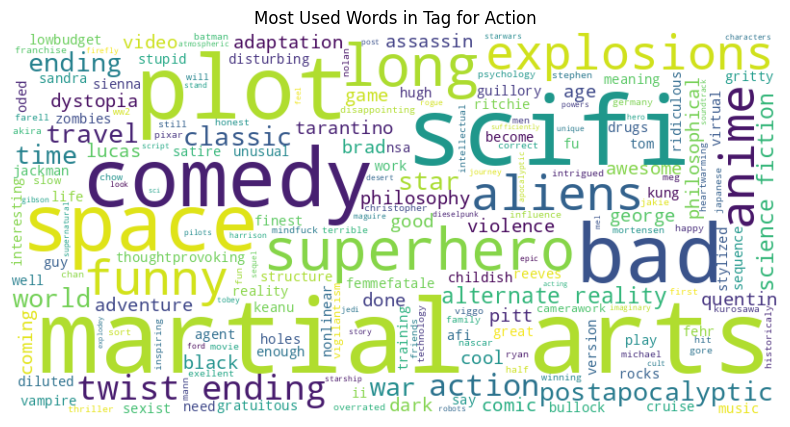

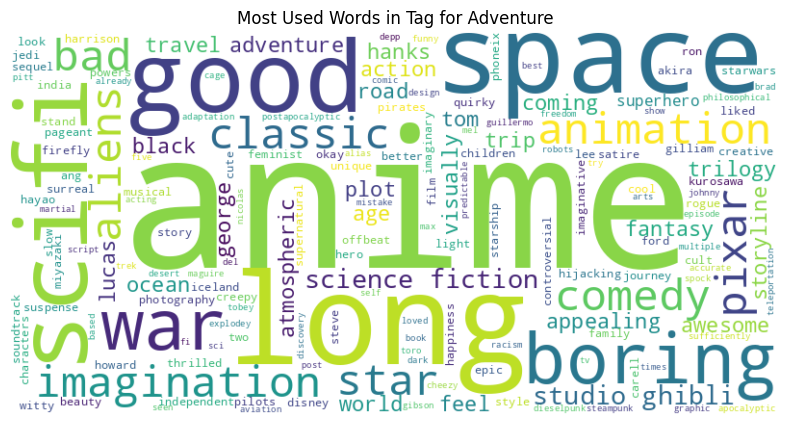

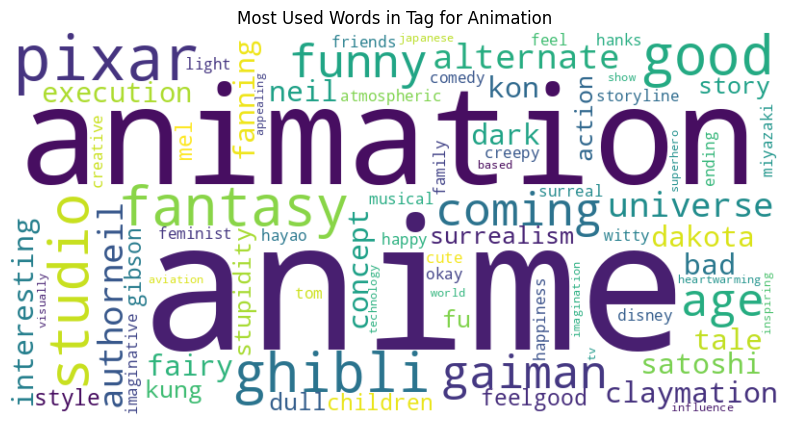

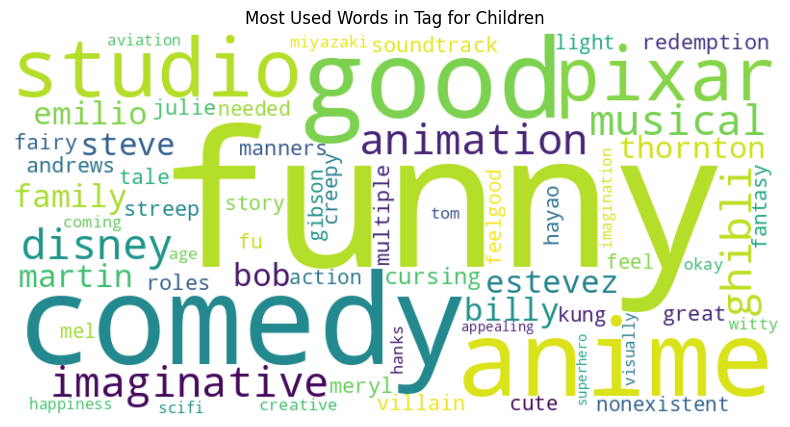

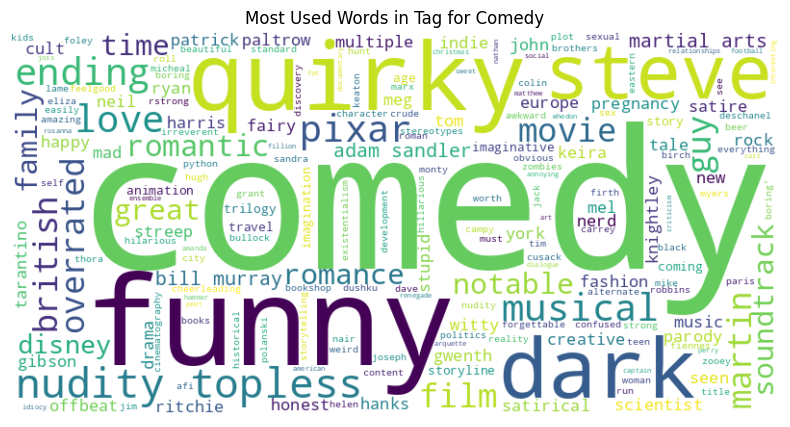

...

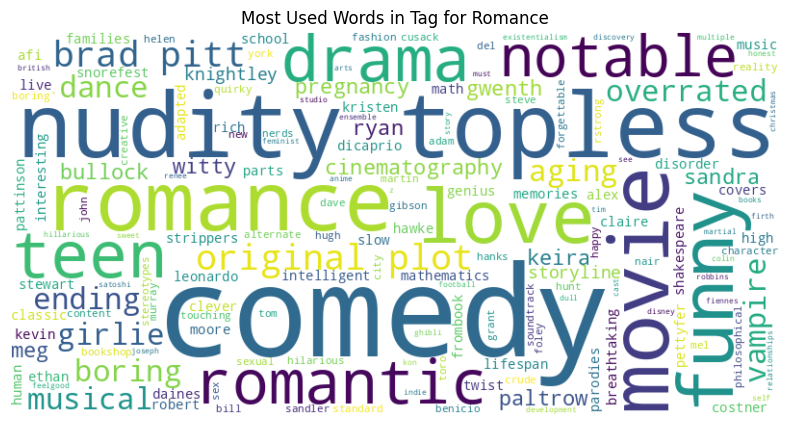

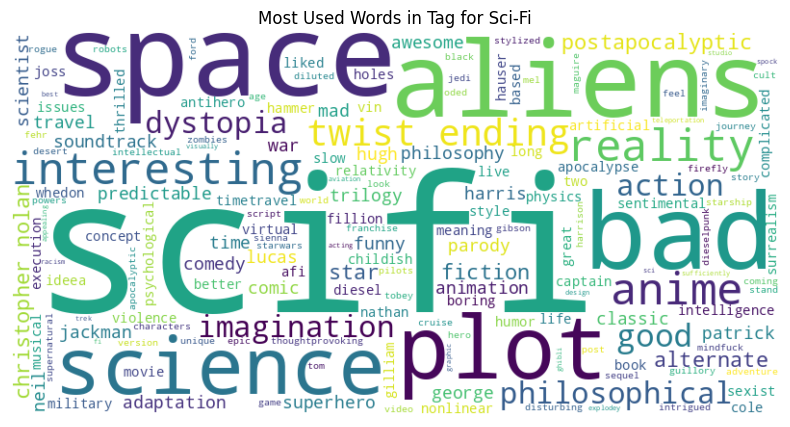

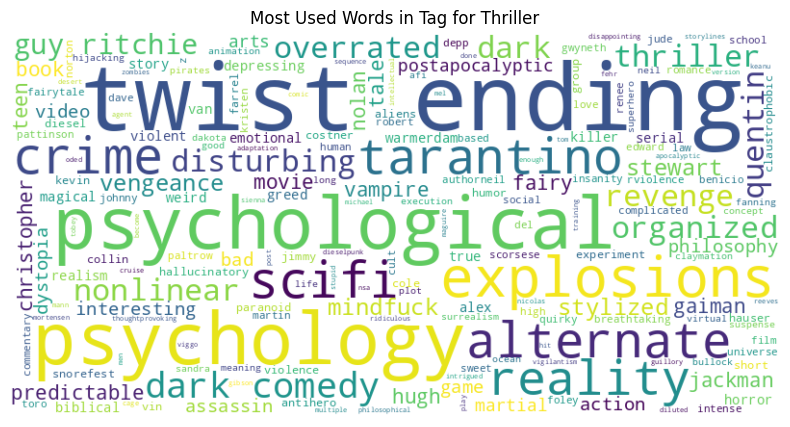

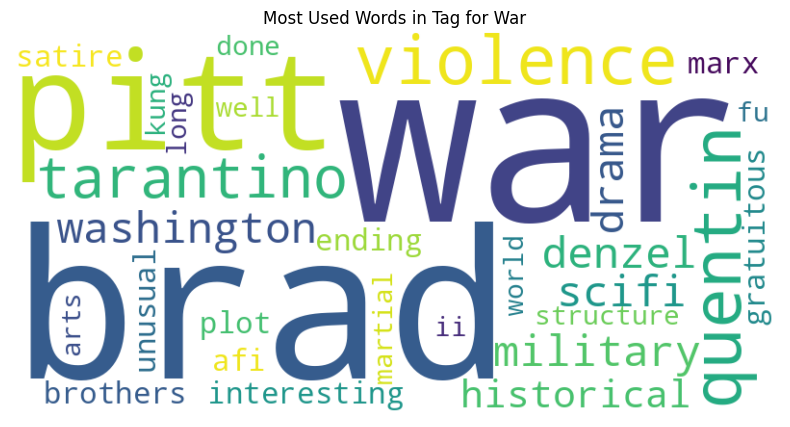

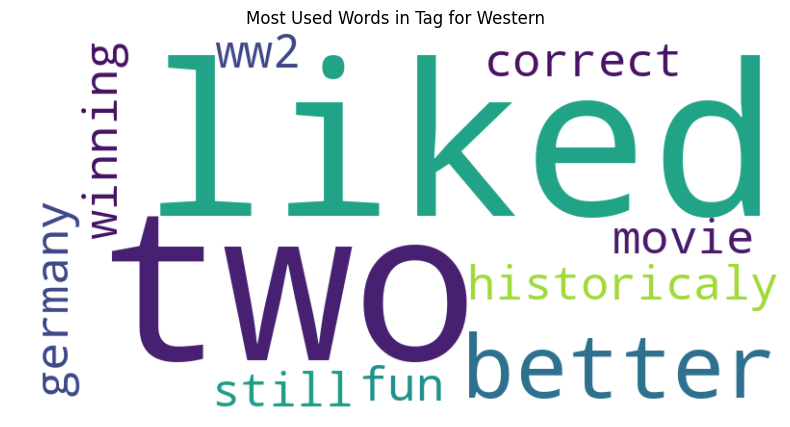

In [ ]:
# also as wordclouds
genre_tag_df = all[genre_columns + ['tag']]

grouped_df = genre_tag_df.fillna('').groupby(genre_columns).agg({'tag': ' '.join}).reset_index()
grouped_df['tag'] = grouped_df['tag'].apply(lambda x: ' '.join([tag for tag in str(x).split() if 'toplist' not in tag]))

for genre in genre_columns:
    tags = grouped_df.loc[grouped_df[genre] == 1, 'tag']
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(tags))

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Most Used Words in Tag for {genre.replace("genre_", "")}')
    plt.axis('off')
    plt.show()

## imdbId & tmdbId

In [ ]:
# relationship between tag numbers in each platform
data = all[['movieId', 'imdbId', 'tmdbId']]

fig = go.Figure(data=go.Scatter3d(
    x=data['movieId'],
    y=data['imdbId'],
    z=data['tmdbId'],
    mode='markers',
    marker=dict(
        size=5,
        color=data['movieId'],
        colorscale='Viridis',
        opacity=0.8
    )
))

fig.update_layout(scene=dict(
    xaxis_title='movieId',
    yaxis_title='imdbId',
    zaxis_title='tmdbId'
))

fig.show()

# Recommendation Systems

## Preprocessing

Before we move on to our models, we:


*   Remove the columns we won't be using: This includes the newly created columns for the genre visualizations, since we already have the genres column, as well as imdbId and tmdbId, since those are merely identifiers for the two platforms, and we already have the identifier for MovieLens. We also delete the colums that we created for better visualizations for the timestamp, since the models are capable of working with datetime objects in the 'timestamp' column.
*   Convert NaN tag values to empty strings, since our models do not handle NaN data well.
*   Clean our data once more to remove duplicates

Note that we already standardized the data for our visualization purposes, so we do not need to repeat the step.

In [ ]:
all.shape

(100416, 33)

In [ ]:
all.head()

,userId,movieId,rating,timestamp,title,genres,imdbId,tmdbId,tag,year,...,genre_Mystery,genre_Romance,genre_Sci-Fi,genre_Thriller,genre_War,genre_Western,timestamp_year,timestamp_month,timestamp_day,timestamp_hour_of_day
0,1,31,2.5,2009-12-14 02:52:24,dangerous minds 1995,drama,112792,9909.0,NaN,1995,...,0,0,0,0,0,0,2009,December,14,2
1,1,1029,3.0,2009-12-14 02:52:59,dumbo 1941,animation children drama musical,33563,11360.0,NaN,1941,...,0,0,0,0,0,0,2009,December,14,2
2,1,1061,3.0,2009-12-14 02:53:02,sleepers 1996,thriller,117665,819.0,NaN,1996,...,0,0,0,1,0,0,2009,December,14,2
3,1,1129,2.0,2009-12-14 02:53:05,escape from new york 1981,action adventure scifi thriller,82340,1103.0,NaN,1981,...,0,0,1,1,0,0,2009,December,14,2
4,1,1172,4.0,2009-12-14 02:53:25,cinema paradiso nuovo cinema paradiso 1989,drama,95765,11216.0,NaN,1989,...,0,0,0,0,0,0,2009,December,14,2


In [ ]:
columns_to_del = genre_columns
columns_to_del.append('imdbId')
columns_to_del.append('tmdbId')
columns_to_del.append('timestamp_year')
columns_to_del.append('timestamp_month')
columns_to_del.append('timestamp_day')
columns_to_del.append('timestamp_hour_of_day')

In [ ]:
columns_to_del

['genre_Action',
 'genre_Adventure',
 'genre_Animation',
 'genre_Children',
 'genre_Comedy',
 'genre_Crime',
 'genre_Documentary',
 'genre_Drama',
 'genre_Fantasy',
 'genre_Film-Noir',
 'genre_Horror',
 'genre_IMAX',
 'genre_Musical',
 'genre_Mystery',
 'genre_Romance',
 'genre_Sci-Fi',
 'genre_Thriller',
 'genre_War',
 'genre_Western',
 'imdbId',
 'tmdbId',
 'timestamp_year',
 'timestamp_month',
 'timestamp_day',
 'timestamp_hour_of_day']

In [ ]:
for e in columns_to_del:
  del all[e]

In [ ]:
all.shape

(100416, 8)

In [ ]:
all.head()

,userId,movieId,rating,timestamp,title,genres,tag,year
0,1,31,2.5,2009-12-14 02:52:24,dangerous minds 1995,drama,NaN,1995
1,1,1029,3.0,2009-12-14 02:52:59,dumbo 1941,animation children drama musical,NaN,1941
2,1,1061,3.0,2009-12-14 02:53:02,sleepers 1996,thriller,NaN,1996
3,1,1129,2.0,2009-12-14 02:53:05,escape from new york 1981,action adventure scifi thriller,NaN,1981
4,1,1172,4.0,2009-12-14 02:53:25,cinema paradiso nuovo cinema paradiso 1989,drama,NaN,1989


In [ ]:
all['tag'] = all['tag'].fillna('')

In [ ]:
def clean_data(df):
    df.drop_duplicates(inplace=True)
    df.dropna(inplace=True)

In [ ]:
clean_data(all)

In [ ]:
all.shape

(100416, 8)

In [ ]:
all.head()

,userId,movieId,rating,timestamp,title,genres,tag,year
0,1,31,2.5,2009-12-14 02:52:24,dangerous minds 1995,drama,,1995
1,1,1029,3.0,2009-12-14 02:52:59,dumbo 1941,animation children drama musical,,1941
2,1,1061,3.0,2009-12-14 02:53:02,sleepers 1996,thriller,,1996
3,1,1129,2.0,2009-12-14 02:53:05,escape from new york 1981,action adventure scifi thriller,,1981
4,1,1172,4.0,2009-12-14 02:53:25,cinema paradiso nuovo cinema paradiso 1989,drama,,1989


In [ ]:
all.isna().sum()

userId       0
movieId      0
rating       0
timestamp    0
title        0
genres       0
tag          0
year         0
dtype: int64

## Tail of The Dataset (The "Interesting" Part)

In this approach, we set the requirement of minimum number of ratings per movie and the minimum number of ratings done by the user to 100.

In [ ]:
# filter data based on the previous plots
min_movie_ratings = 100
filter_movies = all['movieId'].value_counts() >= min_movie_ratings
filter_movies = filter_movies[filter_movies].index.tolist()

min_user_ratings = 100
filter_users = all['userId'].value_counts() >= min_user_ratings
filter_users = filter_users[filter_users].index.tolist()

new_all = all[(all['movieId'].isin(filter_movies)) & (all['userId'].isin(filter_users))]

In [ ]:
print('all shape: {}'.format(all.shape))
print('new_all shape: {}'.format(new_all.shape))

all shape: (100416, 8)
new_all shape: (16054, 8)


In [ ]:
df_new = new_all[['userId','movieId', 'rating']]
df_new

,userId,movieId,rating
147,4,10,4.0
148,4,34,5.0
151,4,153,4.0
153,4,185,3.0
154,4,260,5.0
...,...,...,...
100419,671,4993,5.0
100420,671,4995,4.0
100424,671,5349,4.0
100426,671,5445,4.5


### Surprise

In [ ]:
from surprise import Reader
from surprise import Dataset
from surprise.model_selection import cross_validate
from surprise import NormalPredictor
from surprise import KNNBasic
from surprise import KNNWithMeans
from surprise import KNNWithZScore
from surprise import KNNBaseline
from surprise import SVD
from surprise import NMF
from surprise import BaselineOnly
from surprise import SVDpp
from surprise import SlopeOne
from surprise import CoClustering
from surprise import accuracy
from surprise.model_selection import train_test_split

In [ ]:
reader = Reader(rating_scale=(0,5))
data = Dataset.load_from_df(df_new,reader)

#### Algorithm Selection

In [ ]:
algos = [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(), KNNBaseline(), KNNBasic(), KNNWithMeans(), KNNWithZScore(), BaselineOnly(), CoClustering()]

In [ ]:
benchmark = []
for algo in algos:
  # results = cross_validate(algo, data, measures=['RMSE'], cv=3, verbose=False)
  results = cross_validate(algo, data, measures=['rmse', 'mae'], cv=3, verbose=False)
  tmp= pd.DataFrame.from_dict(results).mean(axis=0)
  tmp= tmp.append(pd.Series([str(algo).split(' ')[0].split('.')[-1]],index=['Algorithm']))
  benchmark.append(tmp)

<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.


<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.


<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.


<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.


<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Estimating biases using als...
Estimating biases using als...
Estimating biases using als...


<ipython-input-106-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [ ]:
surprise_results = pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')
surprise_results

,test_rmse,test_mae,fit_time,test_time
Algorithm,,,,
SVDpp,0.820713,0.623821,1.009930,0.379418
KNNBaseline,0.828649,0.628789,0.016495,0.442352
KNNWithZScore,0.831721,0.628912,0.021847,0.395971
KNNWithMeans,0.832062,0.631694,0.016075,0.391985
SVD,0.835326,0.636257,0.080226,0.021389
SlopeOne,0.835776,0.635632,0.010003,0.124481
BaselineOnly,0.844094,0.642472,0.006630,0.012941
NMF,0.853312,0.651825,0.098814,0.022257
KNNBasic,0.871181,0.661910,0.013279,0.591332


In [ ]:
fig = go.Figure(data=[
    go.Bar(
        name='RMSE',
        x=surprise_results.index,
        y=surprise_results['test_rmse'],
        text=surprise_results['test_rmse'],
        texttemplate='%{text:.3f}',
        textposition='inside',
        marker=dict(color=purple_viridis)
    ),
    go.Bar(
        name='MAE',
        x=surprise_results.index,
        y=surprise_results['test_mae'],
        text=surprise_results['test_mae'],
        texttemplate='%{text:.3f}',
        textposition='inside',
        marker=dict(color=blue_viridis)
    )
])

fig.update_layout(barmode='group', title='RMSE and MAE for Each Algorithm', xaxis_title='Algorithm', yaxis_title='Error')

fig.show()

SVDpp algorithm gave us the best RMSE, therefore, we will proceed further with SVDpp and use Alternating Least Squares (ALS).

In [ ]:
algo = SVDpp() # pick the best algo w smaller test_rmse
print('Using ALS')
cross_validate(algo, data, measures=['RMSE'], cv=5, verbose=False)

Using ALS


{'test_rmse': array([0.8060542 , 0.7922753 , 0.81397392, 0.79654851, 0.81832061]),
 'fit_time': (1.4075984954833984,
  1.4260408878326416,
  1.4367527961730957,
  1.4297435283660889,
  1.3991649150848389),
 'test_time': (0.34122323989868164,
  0.3164801597595215,
  0.31812167167663574,
  0.31580662727355957,
  0.31078028678894043)}

#### Performance Measurements

In [ ]:
# taken from https://surprise.readthedocs.io/en/stable/FAQ.html#how-to-compute-precision-k-and-recall-k
from collections import defaultdict
def precision_recall_at_k(predictions, k=10, threshold=3.5):
    """Return precision and recall at k metrics for each user"""

    # First map the predictions to each user.
    user_est_true = defaultdict(list)
    for uid, _, true_r, est, _ in predictions:
        user_est_true[uid].append((est, true_r))

    precisions = dict()
    recalls = dict()
    for uid, user_ratings in user_est_true.items():

        # Sort user ratings by estimated value
        user_ratings.sort(key=lambda x: x[0], reverse=True)

        # Number of relevant items
        n_rel = sum((true_r >= threshold) for (_, true_r) in user_ratings)

        # Number of recommended items in top k
        n_rec_k = sum((est >= threshold) for (est, _) in user_ratings[:k])

        # Number of relevant and recommended items in top k
        n_rel_and_rec_k = sum(
            ((true_r >= threshold) and (est >= threshold))
            for (est, true_r) in user_ratings[:k]
        )

        # Precision@K: Proportion of recommended items that are relevant
        # When n_rec_k is 0, Precision is undefined. We here set it to 0.

        precisions[uid] = n_rel_and_rec_k / n_rec_k if n_rec_k != 0 else 0

        # Recall@K: Proportion of relevant items that are recommended
        # When n_rel is 0, Recall is undefined. We here set it to 0.

        recalls[uid] = n_rel_and_rec_k / n_rel if n_rel != 0 else 0

    return precisions, recalls

In [ ]:
trainset,testset= train_test_split(data,test_size=0.2) # or 0.25?
algo = SVDpp() # put best performed algo here
predictions = algo.fit(trainset).test(testset)
accuracy.rmse(predictions)

RMSE: 0.8304


0.8304486093982963

In [ ]:
precisions, recalls = precision_recall_at_k(predictions, k=10, threshold=3.5)
# Precision and recall can then be averaged over all users
precision10_surprise_interesting = sum(prec for prec in precisions.values()) / len(precisions)
recall10_surprise_interesting = sum(rec for rec in recalls.values()) / len(recalls)
print(precision10_surprise_interesting)
print(recall10_surprise_interesting)

0.8000015031265034
0.7288683351377611


In [ ]:
# from https://github.com/shhudspeth/BookRecommendationSystem/blob/master/Recommender%20Using%20Surprise.ipynb
from sklearn.metrics import roc_auc_score, roc_curve, auc
def make_binary_tpr_fpr(predictions, threshold=3.5):
    pred_df = pd.DataFrame(predictions)
    pred_df['r_ui'].where(pred_df['r_ui']>threshold, 1, inplace=True)
    pred_df['r_ui'].where(pred_df['r_ui']<=threshold, 0, inplace=True)

    pred_df['est'].where(pred_df['est']>threshold, 1, inplace=True)
    pred_df['est'].where(pred_df['est']<=threshold, 0, inplace=True)

    return pred_df['r_ui'], pred_df['est'],

true_r, est = make_binary_tpr_fpr(predictions)
fpr, tpr, thresholds = roc_curve(true_r, est)
surprise_auc_interesting = auc(fpr, tpr)
print(surprise_auc_interesting)

0.6817973326974729


In [ ]:
# show the first 10 predicions (to see the format)
predictions[:10]

[Prediction(uid=592, iid=1240, r_ui=4.0, est=4.2967542448452605, details={'was_impossible': False}),
 Prediction(uid=496, iid=500, r_ui=4.0, est=4.0555958825444565, details={'was_impossible': False}),
 Prediction(uid=531, iid=4896, r_ui=1.0, est=2.910501340209203, details={'was_impossible': False}),
 Prediction(uid=461, iid=1206, r_ui=4.0, est=3.9201477417986768, details={'was_impossible': False}),
 Prediction(uid=528, iid=608, r_ui=4.0, est=4.006282266745979, details={'was_impossible': False}),
 Prediction(uid=34, iid=50, r_ui=5.0, est=4.51323240859478, details={'was_impossible': False}),
 Prediction(uid=381, iid=608, r_ui=1.0, est=4.191051034368794, details={'was_impossible': False}),
 Prediction(uid=665, iid=1196, r_ui=4.0, est=4.261067217207263, details={'was_impossible': False}),
 Prediction(uid=647, iid=1225, r_ui=4.0, est=4.642000454276075, details={'was_impossible': False}),
 Prediction(uid=596, iid=589, r_ui=4.0, est=4.1892148618247536, details={'was_impossible': False})]

In [ ]:
# put prediction in a dataframe df
def get_Iu(uid):
    """ return the number of items rated by given user
    args:
      uid: the id of the user
    returns:
      the number of items rated by the user
    """
    try:
        return len(trainset.ur[trainset.to_inner_uid(uid)])
    except ValueError:
        return 0

def get_Ui(iid):
    """ return number of users that have rated given item
    args:
      iid: the raw id of the item
    returns:
      the number of users that have rated the item.
    """
    try:
        return len(trainset.ir[trainset.to_inner_iid(iid)])
    except ValueError:
        return 0

df = pd.DataFrame(predictions, columns=['uid','iid','rui','est','details'])
df['Iu']= df.uid.apply(get_Iu)
df['Ui']= df.iid.apply(get_Ui)
df['err'] = abs(df.est - df.rui)
df.head()

,uid,iid,rui,est,details,Iu,Ui,err
0,592,1240,4.0,4.296754,{'was_impossible': False},38,106,0.296754
1,496,500,4.0,4.055596,{'was_impossible': False},30,88,0.055596
2,531,4896,1.0,2.910501,{'was_impossible': False},42,74,1.910501
3,461,1206,4.0,3.920148,{'was_impossible': False},101,77,0.079852
4,528,608,4.0,4.006282,{'was_impossible': False},27,101,0.006282


In [ ]:
select_n=20
best=df.sort_values(by='err')[:select_n]
worst=df.sort_values(by='err')[-select_n:]

In [ ]:
best

,uid,iid,rui,est,details,Iu,Ui,err
2099,654,318,5.0,5.000000,{'was_impossible': False},109,143,0.000000
630,287,7153,5.0,5.000000,{'was_impossible': False},33,94,0.000000
1380,4,1196,5.0,5.000000,{'was_impossible': False},43,126,0.000000
529,518,356,5.0,5.000000,{'was_impossible': False},72,157,0.000000
1408,559,1197,5.0,5.000000,{'was_impossible': False},32,93,0.000000
3124,4,296,5.0,5.000000,{'was_impossible': False},43,150,0.000000
205,177,50,5.0,5.000000,{'was_impossible': False},41,107,0.000000
1312,128,5952,5.0,5.000000,{'was_impossible': False},41,116,0.000000
1746,547,2329,4.0,4.000054,{'was_impossible': False},84,57,0.000054
2956,654,454,4.0,3.999586,{'was_impossible': False},109,55,0.000414


In [ ]:
worst

,uid,iid,rui,est,details,Iu,Ui,err
2666,547,2174,0.5,3.277514,{'was_impossible': False},84,68,2.777514
1413,30,288,1.0,3.780191,{'was_impossible': False},93,59,2.780191
1625,378,58559,0.5,3.282273,{'was_impossible': False},26,54,2.782273
1656,187,4993,1.0,3.789800,{'was_impossible': False},47,116,2.789800
2439,99,3578,1.0,3.811871,{'was_impossible': False},39,97,2.811871
1195,175,2028,1.0,3.848229,{'was_impossible': False},33,111,2.848229
1438,450,3578,1.0,3.871315,{'was_impossible': False},45,97,2.871315
1522,75,858,1.0,3.872387,{'was_impossible': False},40,106,2.872387
127,68,6874,1.0,3.902719,{'was_impossible': False},50,72,2.902719
1787,609,912,1.0,3.913866,{'was_impossible': False},5,66,2.913866


Worst: 2351,	282,	2959,	0.5,	4.312258, {'was_impossible': False},	48,	112,	3.812258

In this run, the worst prediction with error rate 3.8 is done for user 282 for movie 2959, where the actual rating was 0.5 and the estimated rating was 4.3.

Overall we see that the low ratings are estimated high. Let's look more in detail.

In [ ]:
fig = px.box(df, x='rui', y='est', hover_data=['uid', 'iid', 'err'], color_discrete_sequence=[purple_viridis])

fig.update_layout(
    title='Box Plot of Estimated Ratings by Actual Ratings',
    xaxis_title='Actual Rating',
    yaxis_title='Estimated Rating'
)

fig.show()

In [ ]:
user_err_stats = df.groupby('uid')['err'].describe()
print(user_err_stats)

     count      mean       std       min       25%       50%       75%  \
uid                                                                      
4     14.0  0.351328  0.279443  0.000000  0.187826  0.304779  0.510806   
5     11.0  0.536715  0.438689  0.090907  0.202034  0.245311  0.820653   
8     12.0  0.516918  0.301360  0.004883  0.349559  0.555361  0.769872   
15    28.0  0.820778  0.696189  0.000513  0.255808  0.812207  1.207687   
17    10.0  0.850632  0.861703  0.228700  0.281462  0.437525  1.127736   
..     ...       ...       ...       ...       ...       ...       ...   
656    4.0  0.462425  0.239474  0.218034  0.298739  0.438143  0.601829   
659    4.0  0.546164  0.570755  0.017646  0.141420  0.442511  0.847256   
664   12.0  0.320283  0.211122  0.021043  0.183322  0.261624  0.416555   
665   18.0  0.666710  0.488636  0.029356  0.296335  0.582471  1.018386   
671   12.0  0.500027  0.294987  0.028890  0.290800  0.466652  0.739268   

          max  
uid            
4    

### LightFM

In [ ]:
pip install LightFM sklearn scipy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from lightfm import LightFM
from lightfm.evaluation import precision_at_k
from lightfm.evaluation import recall_at_k
from lightfm.evaluation import auc_score
from lightfm.data import Dataset

from sklearn.preprocessing import LabelEncoder
from scipy.sparse import coo_matrix

#### Split Data into Train and Test Sets

In [ ]:
# thanks to Mingzhi
# https://msha096.github.io/blog/lightfm/
def create_rate_matrix(df, shuffle = True, split_ratio = 0.8):
    '''
    Split the Pandas DataFrame into train and test according to the split_ratio.
    INPUT:
      - df: Pandas DataFrame of interaction data, including user id, product id, and rate.
      - shuffle: boolean, whether to randomly shuffle the dataframe before splitting
      - split_ratio: the ratio of train and test
    OUTPUT:
      - rate_matrix: a dictionary, keys ['train', 'test'], value is coo_matrix of the same shape
    '''
    if shuffle:
        df = df.sample(frac = 1).reset_index(drop = True)
    split_point = np.int(np.round(df.shape[0] * split_ratio))
    df_train = df.iloc[0:split_point]
    df_test = df.iloc[split_point::]
    df_test = df_test[(df_test['userId'].isin(df_train['userId']))&\
                     (df_test['movieId'].isin(df_train['movieId']))]

    print('Train dataset size is %d, test dataset size is %d'
          % (len(df_train), len(df_test)))

    id_cols = ['userId', 'movieId']
    trans_cat_train = dict()
    trans_cat_test = dict()

    encoder = dict()
    for k in id_cols:
        le = LabelEncoder()
        trans_cat_train[k] = le.fit_transform(df_train[k].values)
        trans_cat_test[k] = le.transform(df_test[k].values)
        encoder[k] = le

    trans_cat_train['rating'] = df_train['rating']
    trans_cat_test['rating'] = df_test['rating']

    users = np.unique(trans_cat_train['userId'])
    items = np.unique(trans_cat_train['movieId'])
    n_users = len(users)
    n_items = len(items)
    print('There are %d users and %d products in dataset.'
          % (n_users, n_items))

    rate_matrix = dict()
    rate_matrix['train'] = coo_matrix((trans_cat_train['rating'],
                                       (trans_cat_train['userId'],
                                        trans_cat_train['movieId'])),
                                      shape = (n_users, n_items))

    rate_matrix['test'] = coo_matrix((trans_cat_test['rating'],
                                      (trans_cat_test['userId'],
                                       trans_cat_test['movieId'])),
                                     shape = (n_users, n_items))

    return rate_matrix, users, items, encoder

In [ ]:
rating_matrix, users, items, encoder_dict = create_rate_matrix(new_all)

Train dataset size is 12843, test dataset size is 3211
There are 265 users and 151 products in dataset.


<ipython-input-123-a7960f3034b8>:15: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



#### Prepare Features

In [ ]:
features = new_all.copy()
features['movieId'] = features['movieId'].apply(lambda x: 'other' if x not in encoder_dict['movieId'].classes_ else x)
features = features[features['movieId'] != 'other']
features['movieId'] = encoder_dict['movieId'].transform(features.movieId.values)
features.shape

(16054, 8)

In [ ]:
columns = features.columns.to_list()
columns.remove('movieId')
columns.remove('userId')
columns.remove('rating')

In [ ]:
def generate_feature_list(df, columns):
    '''
    Generate the list of features of corresponding columns to list
    In order to fit the lightdm Dataset
    '''
    features = df[columns].apply(
        lambda x: ','.join(x.map(str)), axis = 1)
    features = features.str.split(',')
    features = features.apply(pd.Series).stack().reset_index(drop = True)
    return features

def prepare_item_features(df, columns, id_col_name):
    '''
    Prepare the corresponding feature formats for
    the lightdm.dataset's build_item_features function
    '''
    features = df[columns].apply(
            lambda x: ','.join(x.map(str)), axis = 1)
    features = features.str.split(',')
    features = list(zip(df[id_col_name], features))
    return features

In [ ]:
# convert data formatted_df in COO format
dataset = Dataset()

fitting_item_features = generate_feature_list(features, columns)
lightdm_features = prepare_item_features(features, columns, 'movieId')

dataset.fit(users, items, item_features = fitting_item_features)
item_feature = dataset.build_item_features(lightdm_features, normalize = True)

num_users, num_items = dataset.interactions_shape()
print('Num users: {}, num_items {}.'.format(num_users, num_items))

Num users: 265, num_items 151.


In [ ]:
trainset = rating_matrix['train']
testset = rating_matrix['test']

In [ ]:
learning_rate = 0.05
epochs = 10
k = 10
no_components = 160

#### Pure - Collaborative Filtering

Try using pure CF with:
* BPR: Bayesian Personalised Ranking pairwise loss. Maximises the prediction difference between a positive example and a randomly chosen negative example. Useful when only positive interactions are present and optimising ROC AUC is desired.
* WARP: Weighted Approximate-Rank Pairwise loss. Maximises the rank of positive examples by repeatedly sampling negative examples until rank violating one is found. Useful when only positive interactions are present and optimising the top of the recommendation list (precision@k) is desired.

In [ ]:
# create model and fit
bpr_model = LightFM(learning_rate=learning_rate, no_components = no_components, loss='bpr')
bpr_model.fit(trainset, epochs=epochs)
bpr_user_bias_pure_interesting = bpr_model.user_biases
bpr_item_bias_pure_interesting = bpr_model.item_biases

warp_model = LightFM(learning_rate=learning_rate, no_components = no_components, loss='warp')
warp_model.fit(trainset, epochs=epochs)
warp_user_bias_pure_interesting = bpr_model.user_biases
warp_item_bias_pure_interesting = bpr_model.item_biases

# metrics
train_precision_bpr_pure_interesting = precision_at_k(bpr_model, trainset, k=k).mean()
test_precision_bpr_pure_interesting = precision_at_k(bpr_model, testset, k=k).mean()

train_recall_bpr_pure_interesting = recall_at_k(bpr_model, trainset, k=k).mean()
test_recall_bpr_pure_interesting = recall_at_k(bpr_model, testset, k=k).mean()

train_auc_bpr_pure_interesting = auc_score(bpr_model, trainset).mean()
test_auc_bpr_pure_interesting = auc_score(bpr_model, testset).mean()

train_precision_warp_pure_interesting = precision_at_k(warp_model, trainset, k=k).mean()
test_precision_warp_pure_interesting = precision_at_k(warp_model, testset, k=k).mean()

train_recall_warp_pure_interesting = recall_at_k(warp_model, trainset, k=k).mean()
test_recall_warp_pure_interesting = recall_at_k(warp_model, testset, k=k).mean()

train_auc_warp_pure_interesting = auc_score(warp_model, trainset).mean()
test_auc_warp_pure_interesting = auc_score(warp_model, testset).mean()

# print metrics
print('Pure CF models:')
print('bpr_model precision: train %.2f, test %.2f.' % (train_precision_bpr_pure_interesting, test_precision_bpr_pure_interesting))
print('bpr_model recall: train %.2f, test %.2f.' % (train_recall_bpr_pure_interesting, test_recall_bpr_pure_interesting))
print('bpr_model AUC: train %.2f, test %.2f.' % (train_auc_bpr_pure_interesting, test_auc_bpr_pure_interesting))
print('-----------------------------------------------')
print('warp_model precision: train %.2f, test %.2f.' % (train_precision_warp_pure_interesting, test_precision_warp_pure_interesting))
print('warp_model recall: train %.2f, test %.2f.' % (train_recall_warp_pure_interesting, test_recall_warp_pure_interesting))
print('warp_model AUC: train %.2f, test %.2f.' % (train_auc_warp_pure_interesting, test_auc_warp_pure_interesting))

Pure CP models:
bpr_model precision: train 0.75, test 0.09.
bpr_model recall: train 0.18, test 0.09.
bpr_model AUC: train 0.82, test 0.60.
-----------------------------------------------
warp_model precision: train 0.98, test 0.01.
warp_model recall: train 0.26, test 0.01.
warp_model AUC: train 0.97, test 0.50.


#### Hybrid - Content Based Filtering & Collaborative Filtering

Try using hybrid (CBF and CF) with:
* BPR: Bayesian Personalised Ranking pairwise loss. Maximises the prediction difference between a positive example and a randomly chosen negative example. Useful when only positive interactions are present and optimising ROC AUC is desired.
* WARP: Weighted Approximate-Rank Pairwise loss. Maximises the rank of positive examples by repeatedly sampling negative examples until rank violating one is found. Useful when only positive interactions are present and optimising the top of the recommendation list (precision@k) is desired.

In [ ]:
bpr_model = LightFM(learning_rate=learning_rate, no_components = no_components, loss='bpr')
bpr_model.fit(trainset, item_features = item_feature, epochs=epochs)
bpr_user_bias_hybrid_interesting = bpr_model.user_biases
bpr_item_bias_hybrid_interesting = bpr_model.item_biases

warp_model = LightFM(learning_rate=learning_rate, no_components = no_components, loss='warp')
warp_model.fit(trainset, item_features = item_feature, epochs=epochs)
warp_user_bias_hybrid_interesting = bpr_model.user_biases
warp_item_bias_hybrid_interesting = bpr_model.item_biases

# metrics
train_precision_bpr_hybrid_interesting = precision_at_k(bpr_model, trainset, k=k, item_features = item_feature).mean()
test_precision_bpr_hybrid_interesting = precision_at_k(bpr_model, testset, k=k, item_features = item_feature).mean()

train_recall_bpr_hybrid_interesting = recall_at_k(bpr_model, trainset, k=k, item_features = item_feature).mean()
test_recall_bpr_hybrid_interesting = recall_at_k(bpr_model, testset, k=k, item_features = item_feature).mean()

train_auc_bpr_hybrid_interesting = auc_score(bpr_model, trainset, item_features = item_feature).mean()
test_auc_bpr_hybrid_interesting = auc_score(bpr_model, testset, item_features = item_feature).mean()

train_precision_warp_hybrid_interesting = precision_at_k(warp_model, trainset, k=k, item_features = item_feature).mean()
test_precision_warp_hybrid_interesting = precision_at_k(warp_model, testset, k=k, item_features = item_feature).mean()

train_recall_warp_hybrid_interesting = recall_at_k(warp_model, trainset, k=k, item_features = item_feature).mean()
test_recall_warp_hybrid_interesting = recall_at_k(warp_model, testset, k=k, item_features = item_feature).mean()

train_auc_warp_hybrid_interesting = auc_score(warp_model, trainset, item_features = item_feature).mean()
test_auc_warp_hybrid_interesting = auc_score(warp_model, testset, item_features = item_feature).mean()

# print metrics
print('Hybrid models:')
print('bpr_model precision: train %.2f, test %.2f.' % (train_precision_bpr_hybrid_interesting, test_precision_bpr_hybrid_interesting))
print('bpr_model recall: train %.2f, test %.2f.' % (train_recall_bpr_hybrid_interesting, test_recall_bpr_hybrid_interesting))
print('bpr_model AUC: train %.2f, test %.2f.' % (train_auc_bpr_hybrid_interesting, test_auc_bpr_hybrid_interesting))
print('-----------------------------------------------')
print('warp_model precision: train %.2f, test %.2f.' % (train_precision_warp_hybrid_interesting, test_precision_warp_hybrid_interesting))
print('warp_model recall: train %.2f, test %.2f.' % (train_recall_warp_hybrid_interesting, test_recall_warp_hybrid_interesting))
print('warp_model AUC: train %.2f, test %.2f.' % (train_auc_warp_hybrid_interesting, test_auc_warp_hybrid_interesting))

Hybrid models:
bpr_model precision: train 0.54, test 0.12.
bpr_model recall: train 0.12, test 0.11.
bpr_model AUC: train 0.64, test 0.58.
-----------------------------------------------
warp_model precision: train 0.84, test 0.06.
warp_model recall: train 0.21, test 0.07.
warp_model AUC: train 0.87, test 0.60.


In [ ]:
user_biases_interesting = {
    'bpr_user_bias_pure': bpr_user_bias_pure_interesting,
    'warp_user_bias_pure': warp_user_bias_pure_interesting,
    'bpr_user_bias_hybrid': bpr_user_bias_hybrid_interesting,
    'warp_user_bias_hybrid': warp_user_bias_hybrid_interesting
}

user_biases_interesting = pd.DataFrame(user_biases_interesting)

In [ ]:
fig = px.box(user_biases_interesting, y=user_biases_interesting.columns, color_discrete_sequence=[purple_viridis])

fig.show()

In [ ]:
item_biases_pure_interesting = {
    'bpr_item_bias_pure': bpr_item_bias_pure_interesting,
    'warp_item_bias_pure': warp_item_bias_pure_interesting
}
item_biases_pure_interesting = pd.DataFrame(item_biases_pure_interesting)

In [ ]:
fig = px.box(item_biases_pure_interesting, y=item_biases_pure_interesting.columns, color_discrete_sequence=[purple_viridis])

fig.show()

In [ ]:
item_biases_hybrid_interesting = {
    'bpr_item_bias_hybrid': bpr_item_bias_hybrid_interesting,
    'warp_item_bias_hybrid': warp_item_bias_hybrid_interesting
}

item_biases_hybrid_interesting = pd.DataFrame(item_biases_hybrid_interesting)

In [ ]:
fig = px.box(item_biases_hybrid_interesting, y=item_biases_hybrid_interesting.columns, color_discrete_sequence=[purple_viridis])

fig.show()

In [ ]:
models = ['BPR CF', 'WARP CF', 'BPR Hybrid', 'WARP Hybrid']
train_auc = [train_auc_bpr_pure_interesting, train_auc_warp_pure_interesting, train_auc_bpr_hybrid_interesting, train_auc_warp_hybrid_interesting]
test_auc = [test_auc_bpr_pure_interesting, test_auc_warp_pure_interesting, test_auc_bpr_hybrid_interesting, test_auc_warp_hybrid_interesting]

fig = go.Figure()
fig.add_trace(go.Bar(x=models, y=train_auc, name='Train AUC',
                     marker_color=purple_viridis, text=train_auc,
                     textposition='auto', texttemplate='%{text:.2f}'))
fig.add_trace(go.Bar(x=models, y=test_auc, name='Test AUC',
                     marker_color=blue_viridis, text=test_auc,
                     textposition='auto', texttemplate='%{text:.2f}'))

fig.update_layout(title='AUC Values for Train and Test Sets',
                  xaxis_title='Models',
                  yaxis_title='AUC',
                  barmode='group')

fig.show()

### Overall AUC Comparison

In [ ]:
models = ['Content-Based', 'BPR CF', 'WARP CF', 'BPR Hybrid', 'WARP Hybrid']

test_auc = [surprise_auc_interesting, test_auc_bpr_pure_interesting, test_auc_warp_pure_interesting, test_auc_bpr_hybrid_interesting, test_auc_warp_hybrid_interesting]

fig = go.Figure()
fig.add_trace(go.Bar(x=models, y=test_auc, name='Test AUC',
                     marker_color=blue_viridis, text=test_auc,
                     textposition='auto', texttemplate='%{text:.2f}'))

fig.update_layout(title='AUC Values',
                  xaxis_title='Recommendation Systems',
                  yaxis_title='AUC',
                  barmode='group')

fig.show()

## The Concentrated Part of The Dataset

In this approach, we set the requirement of maximum number of ratings per movie and the maximum number of ratings done by the user to 100.

In [ ]:
# filter data based on the previous plots
max_movie_ratings = 300
filter_movies = all['movieId'].value_counts() <= max_movie_ratings
filter_movies = filter_movies[filter_movies].index.tolist()

max_user_ratings = 500
filter_users = all['userId'].value_counts() <= max_user_ratings
filter_users = filter_users[filter_users].index.tolist()

new_all = all[(all['movieId'].isin(filter_movies)) & (all['userId'].isin(filter_users))]

In [ ]:
print('all shape: {}'.format(all.shape))
print('new_all shape: {}'.format(new_all.shape))

all shape: (100416, 8)
new_all shape: (65643, 8)


In [ ]:
df_new = new_all[['userId','movieId', 'rating']]
df_new

,userId,movieId,rating
0,1,31,2.5
1,1,1029,3.0
2,1,1061,3.0
3,1,1129,2.0
4,1,1172,4.0
...,...,...,...
100436,671,6268,2.5
100437,671,6269,4.0
100438,671,6365,4.0
100439,671,6385,2.5


### Surprise

In [ ]:
from surprise import Reader
from surprise import Dataset
from surprise.model_selection import cross_validate
from surprise import NormalPredictor
from surprise import KNNBasic
from surprise import KNNWithMeans
from surprise import KNNWithZScore
from surprise import KNNBaseline
from surprise import SVD
from surprise import NMF
from surprise import BaselineOnly
from surprise import SVDpp
from surprise import SlopeOne
from surprise import CoClustering
from surprise import accuracy
from surprise.model_selection import train_test_split

In [ ]:
reader = Reader(rating_scale=(0,5))
data = Dataset.load_from_df(df_new,reader)

#### Algorithm Selection

In [ ]:
algos = [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(), KNNBaseline(), KNNBasic(), KNNWithMeans(), KNNWithZScore(), BaselineOnly(), CoClustering()]

In [ ]:
benchmark = []
for algo in algos:
  # results = cross_validate(algo, data, measures=['RMSE'], cv=3, verbose=False)
  results = cross_validate(algo, data, measures=['rmse', 'mae'], cv=3, verbose=False)
  tmp= pd.DataFrame.from_dict(results).mean(axis=0)
  tmp= tmp.append(pd.Series([str(algo).split(' ')[0].split('.')[-1]],index=['Algorithm']))
  benchmark.append(tmp)

<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.


<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.


<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.


<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.


<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Estimating biases using als...
Estimating biases using als...
Estimating biases using als...


<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-147-bfe20a1ec6b2>:6: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [ ]:
surprise_results = pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')
surprise_results

,test_rmse,test_mae,fit_time,test_time
Algorithm,,,,
SVDpp,0.902272,0.688509,10.956177,4.166960
SVD,0.905756,0.693469,0.582603,0.182863
BaselineOnly,0.908341,0.697003,0.064246,0.128771
KNNBaseline,0.916132,0.696098,0.094355,1.101793
KNNWithMeans,0.940388,0.714426,0.055814,1.087812
KNNWithZScore,0.942660,0.711840,0.077599,1.036502
SlopeOne,0.950386,0.723454,0.943026,2.208038
NMF,0.978692,0.749503,1.130700,0.159550
CoClustering,0.986015,0.760704,1.152929,0.067917


In [ ]:
fig = go.Figure(data=[
    go.Bar(
        name='RMSE',
        x=surprise_results.index,
        y=surprise_results['test_rmse'],
        text=surprise_results['test_rmse'],
        texttemplate='%{text:.3f}',
        textposition='inside',
        marker=dict(color=purple_viridis)
    ),
    go.Bar(
        name='MAE',
        x=surprise_results.index,
        y=surprise_results['test_mae'],
        text=surprise_results['test_mae'],
        texttemplate='%{text:.3f}',
        textposition='inside',
        marker=dict(color=blue_viridis)
    )
])

fig.update_layout(barmode='group', title='RMSE and MAE for Each Algorithm', xaxis_title='Algorithm', yaxis_title='Error')

fig.show()

In [ ]:
algo = SVDpp() # pick the best algo w smaller test_rmse
print('Using ALS')
cross_validate(algo, data, measures=['RMSE'], cv=5, verbose=False)

Using ALS


{'test_rmse': array([0.89456537, 0.90488211, 0.88247049, 0.898025  , 0.89335994]),
 'fit_time': (15.488689184188843,
  17.045469284057617,
  15.677323341369629,
  15.81437087059021,
  15.692840099334717),
 'test_time': (4.905811309814453,
  2.6001787185668945,
  2.3811447620391846,
  2.587265729904175,
  2.5405335426330566)}

#### Performance Measurements

In [ ]:
# taken from https://surprise.readthedocs.io/en/stable/FAQ.html#how-to-compute-precision-k-and-recall-k
from collections import defaultdict
def precision_recall_at_k(predictions, k=10, threshold=3.5):
    """Return precision and recall at k metrics for each user"""

    # First map the predictions to each user.
    user_est_true = defaultdict(list)
    for uid, _, true_r, est, _ in predictions:
        user_est_true[uid].append((est, true_r))

    precisions = dict()
    recalls = dict()
    for uid, user_ratings in user_est_true.items():

        # Sort user ratings by estimated value
        user_ratings.sort(key=lambda x: x[0], reverse=True)

        # Number of relevant items
        n_rel = sum((true_r >= threshold) for (_, true_r) in user_ratings)

        # Number of recommended items in top k
        n_rec_k = sum((est >= threshold) for (est, _) in user_ratings[:k])

        # Number of relevant and recommended items in top k
        n_rel_and_rec_k = sum(
            ((true_r >= threshold) and (est >= threshold))
            for (est, true_r) in user_ratings[:k]
        )

        # Precision@K: Proportion of recommended items that are relevant
        # When n_rec_k is 0, Precision is undefined. We here set it to 0.

        precisions[uid] = n_rel_and_rec_k / n_rec_k if n_rec_k != 0 else 0

        # Recall@K: Proportion of relevant items that are recommended
        # When n_rel is 0, Recall is undefined. We here set it to 0.

        recalls[uid] = n_rel_and_rec_k / n_rel if n_rel != 0 else 0

    return precisions, recalls

In [ ]:
trainset,testset= train_test_split(data,test_size=0.2) # or 0.25?
algo = SVDpp() # put best performed algo here
predictions = algo.fit(trainset).test(testset)
accuracy.rmse(predictions)

RMSE: 0.9022


0.9022444906609633

In [ ]:
precisions, recalls = precision_recall_at_k(predictions, k=10, threshold=3.5)
# Precision and recall can then be averaged over all users
precision10_surprise_concentrated = sum(prec for prec in precisions.values()) / len(precisions)
recall10_surprise_concentrated = sum(rec for rec in recalls.values()) / len(recalls)
print(precision10_surprise_concentrated)
print(recall10_surprise_concentrated)

0.7447340705634564
0.4141440853290074


In [ ]:
# from https://github.com/shhudspeth/BookRecommendationSystem/blob/master/Recommender%20Using%20Surprise.ipynb
from sklearn.metrics import roc_auc_score, roc_curve, auc
def make_binary_tpr_fpr(predictions, threshold=3.5):
    pred_df = pd.DataFrame(predictions)
    pred_df['r_ui'].where(pred_df['r_ui']>threshold, 1, inplace=True)
    pred_df['r_ui'].where(pred_df['r_ui']<=threshold, 0, inplace=True)

    pred_df['est'].where(pred_df['est']>threshold, 1, inplace=True)
    pred_df['est'].where(pred_df['est']<=threshold, 0, inplace=True)

    return pred_df['r_ui'], pred_df['est'],

true_r, est = make_binary_tpr_fpr(predictions)
fpr, tpr, thresholds = roc_curve(true_r, est)
surprise_auc_concentrated = auc(fpr, tpr)
print(surprise_auc_concentrated)

0.6845237851291814


In [ ]:
# show the first 10 predicions (to see the format)
predictions[:10]

[Prediction(uid=365, iid=5991, r_ui=5.0, est=4.01090198872573, details={'was_impossible': False}),
 Prediction(uid=84, iid=65514, r_ui=2.5, est=3.777814522107814, details={'was_impossible': False}),
 Prediction(uid=200, iid=4661, r_ui=2.5, est=3.2918949210163677, details={'was_impossible': False}),
 Prediction(uid=473, iid=2, r_ui=5.0, est=4.071859922540258, details={'was_impossible': False}),
 Prediction(uid=665, iid=3752, r_ui=3.0, est=2.924300758832494, details={'was_impossible': False}),
 Prediction(uid=650, iid=141, r_ui=1.0, est=3.5727129341169466, details={'was_impossible': False}),
 Prediction(uid=265, iid=2583, r_ui=4.0, est=3.765236477371599, details={'was_impossible': False}),
 Prediction(uid=480, iid=4896, r_ui=5.0, est=4.13373538011655, details={'was_impossible': False}),
 Prediction(uid=386, iid=527, r_ui=5.0, est=3.9208154345231807, details={'was_impossible': False}),
 Prediction(uid=95, iid=3617, r_ui=5.0, est=3.8498149861774524, details={'was_impossible': False})]

In [ ]:
# put prediction in a dataframe df
def get_Iu(uid):
    """ return the number of items rated by given user
    args:
      uid: the id of the user
    returns:
      the number of items rated by the user
    """
    try:
        return len(trainset.ur[trainset.to_inner_uid(uid)])
    except ValueError:
        return 0

def get_Ui(iid):
    """ return number of users that have rated given item
    args:
      iid: the raw id of the item
    returns:
      the number of users that have rated the item.
    """
    try:
        return len(trainset.ir[trainset.to_inner_iid(iid)])
    except ValueError:
        return 0

df = pd.DataFrame(predictions, columns=['uid','iid','rui','est','details'])
df['Iu']= df.uid.apply(get_Iu)
df['Ui']= df.iid.apply(get_Ui)
df['err'] = abs(df.est - df.rui)
df.head()

,uid,iid,rui,est,details,Iu,Ui,err
0,365,5991,5.0,4.010902,{'was_impossible': False},59,27,0.989098
1,84,65514,2.5,3.777815,{'was_impossible': False},89,11,1.277815
2,200,4661,2.5,3.291895,{'was_impossible': False},205,1,0.791895
3,473,2,5.0,4.071860,{'was_impossible': False},54,72,0.928140
4,665,3752,3.0,2.924301,{'was_impossible': False},352,23,0.075699


In [ ]:
select_n=20
best=df.sort_values(by='err')[:select_n]
worst=df.sort_values(by='err')[-select_n:]

In [ ]:
best

,uid,iid,rui,est,details,Iu,Ui,err
404,46,58559,5.0,5.0,{'was_impossible': False},31,82,0.0
9688,242,953,5.0,5.0,{'was_impossible': False},318,39,0.0
13090,242,1221,5.0,5.0,{'was_impossible': False},318,74,0.0
7663,211,969,5.0,5.0,{'was_impossible': False},44,30,0.0
7948,577,1199,5.0,5.0,{'was_impossible': False},215,39,0.0
1531,346,541,5.0,5.0,{'was_impossible': False},267,92,0.0
7645,364,109249,5.0,5.0,{'was_impossible': False},130,4,0.0
10639,89,5952,5.0,5.0,{'was_impossible': False},50,132,0.0
9901,656,858,5.0,5.0,{'was_impossible': False},98,137,0.0
236,577,1291,5.0,5.0,{'was_impossible': False},215,97,0.0


In [ ]:
worst

,uid,iid,rui,est,details,Iu,Ui,err
12097,363,110,1.0,4.396910,{'was_impossible': False},155,154,3.396910
7110,341,1748,0.5,3.910779,{'was_impossible': False},15,26,3.410779
10697,26,6333,0.5,3.911998,{'was_impossible': False},132,53,3.411998
12217,83,1358,0.5,3.933014,{'was_impossible': False},129,32,3.433014
12641,150,5445,0.5,3.941982,{'was_impossible': False},336,73,3.441982
4990,480,2706,0.5,3.965220,{'was_impossible': False},302,70,3.465220
12773,378,58559,0.5,3.966872,{'was_impossible': False},108,82,3.466872
3545,432,6040,0.5,4.010655,{'was_impossible': False},48,1,3.510655
10801,83,5445,0.5,4.011647,{'was_impossible': False},129,73,3.511647
4491,341,2947,0.5,4.018326,{'was_impossible': False},15,23,3.518326


In [ ]:
fig = px.box(df, x='rui', y='est', hover_data=['uid', 'iid', 'err'], color_discrete_sequence=[purple_viridis])

fig.update_layout(
    title='Box Plot of Estimated Ratings by Actual Ratings',
    xaxis_title='Actual Rating',
    yaxis_title='Estimated Rating'
)

fig.show()

In [ ]:
user_err_stats = df.groupby('uid')['err'].describe()
print(user_err_stats)

     count      mean       std       min       25%       50%       75%  \
uid                                                                      
1      6.0  0.699412  0.395636  0.210159  0.457559  0.604257  1.048096   
2     21.0  0.707363  0.483800  0.022868  0.419576  0.628448  0.987573   
3      6.0  0.315969  0.137388  0.121740  0.236981  0.307125  0.431744   
4     35.0  0.612318  0.546109  0.000000  0.320561  0.518328  0.705070   
5     16.0  0.532978  0.389058  0.029098  0.308681  0.357853  0.735542   
..     ...       ...       ...       ...       ...       ...       ...   
667   12.0  0.568265  0.411698  0.158827  0.235282  0.474317  0.678560   
668    5.0  0.720039  0.374502  0.192029  0.618477  0.628296  1.039879   
669    4.0  0.589831  0.354929  0.061475  0.563222  0.735227  0.761836   
670    4.0  1.420835  1.115777  0.055319  1.064435  1.419943  1.776343   
671   20.0  0.754245  0.642396  0.042193  0.234773  0.582411  1.123532   

          max  
uid            
1    

### LightFM

In [ ]:
from lightfm import LightFM
from lightfm.evaluation import precision_at_k
from lightfm.evaluation import recall_at_k
from lightfm.evaluation import auc_score
from lightfm.data import Dataset

from sklearn.preprocessing import LabelEncoder
from scipy.sparse import coo_matrix

#### Split Data into Train and Test Sets

In [ ]:
# thanks to Mingzhi
# https://msha096.github.io/blog/lightfm/
def create_rate_matrix(df, shuffle = True, split_ratio = 0.8):
    '''
    Split the Pandas DataFrame into train and test according to the split_ratio.
    INPUT:
      - df: Pandas DataFrame of interaction data, including user id, product id, and rate.
      - shuffle: boolean, whether to randomly shuffle the dataframe before splitting
      - split_ratio: the ratio of train and test
    OUTPUT:
      - rate_matrix: a dictionary, keys ['train', 'test'], value is coo_matrix of the same shape
    '''
    if shuffle:
        df = df.sample(frac = 1).reset_index(drop = True)
    split_point = np.int(np.round(df.shape[0] * split_ratio))
    df_train = df.iloc[0:split_point]
    df_test = df.iloc[split_point::]
    df_test = df_test[(df_test['userId'].isin(df_train['userId']))&\
                     (df_test['movieId'].isin(df_train['movieId']))]

    print('Train dataset size is %d, test dataset size is %d'
          % (len(df_train), len(df_test)))

    id_cols = ['userId', 'movieId']
    trans_cat_train = dict()
    trans_cat_test = dict()

    encoder = dict()
    for k in id_cols:
        le = LabelEncoder()
        trans_cat_train[k] = le.fit_transform(df_train[k].values)
        trans_cat_test[k] = le.transform(df_test[k].values)
        encoder[k] = le

    trans_cat_train['rating'] = df_train['rating']
    trans_cat_test['rating'] = df_test['rating']

    users = np.unique(trans_cat_train['userId'])
    items = np.unique(trans_cat_train['movieId'])
    n_users = len(users)
    n_items = len(items)
    print('There are %d users and %d products in dataset.'
          % (n_users, n_items))

    rate_matrix = dict()
    rate_matrix['train'] = coo_matrix((trans_cat_train['rating'],
                                       (trans_cat_train['userId'],
                                        trans_cat_train['movieId'])),
                                      shape = (n_users, n_items))

    rate_matrix['test'] = coo_matrix((trans_cat_test['rating'],
                                      (trans_cat_test['userId'],
                                       trans_cat_test['movieId'])),
                                     shape = (n_users, n_items))

    return rate_matrix, users, items, encoder

In [ ]:
rating_matrix, users, items, encoder_dict = create_rate_matrix(new_all)

Train dataset size is 52514, test dataset size is 12586
There are 634 users and 6155 products in dataset.


<ipython-input-163-a7960f3034b8>:15: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



#### Prepare Features

In [ ]:
features = new_all.copy()
features['movieId'] = features['movieId'].apply(lambda x: 'other' if x not in encoder_dict['movieId'].classes_ else x)
features = features[features['movieId'] != 'other']
features['movieId'] = encoder_dict['movieId'].transform(features.movieId.values)
features.shape

(65100, 8)

In [ ]:
columns = features.columns.to_list()
columns.remove('movieId')
columns.remove('userId')
columns.remove('rating')

In [ ]:
def generate_feature_list(df, columns):
    '''
    Generate the list of features of corresponding columns to list
    In order to fit the lightdm Dataset
    '''
    features = df[columns].apply(
        lambda x: ','.join(x.map(str)), axis = 1)
    features = features.str.split(',')
    features = features.apply(pd.Series).stack().reset_index(drop = True)
    return features

def prepare_item_features(df, columns, id_col_name):
    '''
    Prepare the corresponding feature formats for
    the lightdm.dataset's build_item_features function
    '''
    features = df[columns].apply(
            lambda x: ','.join(x.map(str)), axis = 1)
    features = features.str.split(',')
    features = list(zip(df[id_col_name], features))
    return features

In [ ]:
# convert data formatted_df in COO format
dataset = Dataset()

fitting_item_features = generate_feature_list(features, columns)
lightdm_features = prepare_item_features(features, columns, 'movieId')

dataset.fit(users, items, item_features = fitting_item_features)
item_feature = dataset.build_item_features(lightdm_features, normalize = True)

num_users, num_items = dataset.interactions_shape()
print('Num users: {}, num_items {}.'.format(num_users, num_items))

Num users: 634, num_items 6155.


In [ ]:
trainset = rating_matrix['train']
testset = rating_matrix['test']

In [ ]:
learning_rate = 0.05
epochs = 10
k = 10
no_components = 160

#### Pure - Collaborative Filtering

Try using pure CF with:
* BPR: Bayesian Personalised Ranking pairwise loss. Maximises the prediction difference between a positive example and a randomly chosen negative example. Useful when only positive interactions are present and optimising ROC AUC is desired.
* WARP: Weighted Approximate-Rank Pairwise loss. Maximises the rank of positive examples by repeatedly sampling negative examples until rank violating one is found. Useful when only positive interactions are present and optimising the top of the recommendation list (precision@k) is desired.

In [ ]:
# create model and fit
bpr_model = LightFM(learning_rate=learning_rate, no_components = no_components, loss='bpr')
bpr_model.fit(trainset, epochs=epochs)
bpr_user_bias_pure_concentrated = bpr_model.user_biases
bpr_item_bias_pure_concentrated = bpr_model.item_biases

warp_model = LightFM(learning_rate=learning_rate, no_components = no_components, loss='warp')
warp_model.fit(trainset, epochs=epochs)
warp_user_bias_pure_concentrated = bpr_model.user_biases
warp_item_bias_pure_concentrated = bpr_model.item_biases

# metrics
train_precision_bpr_pure_concentrated = precision_at_k(bpr_model, trainset, k=k).mean()
test_precision_bpr_pure_concentrated = precision_at_k(bpr_model, testset, k=k).mean()

train_recall_bpr_pure_concentrated = recall_at_k(bpr_model, trainset, k=k).mean()
test_recall_bpr_pure_concentrated = recall_at_k(bpr_model, testset, k=k).mean()

train_auc_bpr_pure_concentrated = auc_score(bpr_model, trainset).mean()
test_auc_bpr_pure_concentrated = auc_score(bpr_model, testset).mean()

train_precision_warp_pure_concentrated = precision_at_k(warp_model, trainset, k=k).mean()
test_precision_warp_pure_concentrated = precision_at_k(warp_model, testset, k=k).mean()

train_recall_warp_pure_concentrated = recall_at_k(warp_model, trainset, k=k).mean()
test_recall_warp_pure_concentrated = recall_at_k(warp_model, testset, k=k).mean()

train_auc_warp_pure_concentrated = auc_score(warp_model, trainset).mean()
test_auc_warp_pure_concentrated = auc_score(warp_model, testset).mean()

# print metrics
print('Pure CF models:')
print('bpr_model precision: train %.2f, test %.2f.' % (train_precision_bpr_pure_concentrated, test_precision_bpr_pure_concentrated))
print('bpr_model recall: train %.2f, test %.2f.' % (train_recall_bpr_pure_concentrated, test_recall_bpr_pure_concentrated))
print('bpr_model AUC: train %.2f, test %.2f.' % (train_auc_bpr_pure_concentrated, test_auc_bpr_pure_concentrated))
print('-----------------------------------------------')
print('warp_model precision: train %.2f, test %.2f.' % (train_precision_warp_pure_concentrated, test_precision_warp_pure_concentrated))
print('warp_model recall: train %.2f, test %.2f.' % (train_recall_warp_pure_concentrated, test_recall_warp_pure_concentrated))
print('warp_model AUC: train %.2f, test %.2f.' % (train_auc_warp_pure_concentrated, test_auc_warp_pure_concentrated))

Pure CP models:
bpr_model precision: train 0.43, test 0.08.
bpr_model recall: train 0.08, test 0.06.
bpr_model AUC: train 0.87, test 0.83.
-----------------------------------------------
warp_model precision: train 0.68, test 0.06.
warp_model recall: train 0.14, test 0.06.
warp_model AUC: train 0.99, test 0.91.


#### Hybrid - Content Based Filtering & Collaborative Filtering

Try using hybrid (CBF and CF) with:
* BPR: Bayesian Personalised Ranking pairwise loss. Maximises the prediction difference between a positive example and a randomly chosen negative example. Useful when only positive interactions are present and optimising ROC AUC is desired.
* WARP: Weighted Approximate-Rank Pairwise loss. Maximises the rank of positive examples by repeatedly sampling negative examples until rank violating one is found. Useful when only positive interactions are present and optimising the top of the recommendation list (precision@k) is desired.

In [ ]:
bpr_model = LightFM(learning_rate=learning_rate, no_components = no_components, loss='bpr')
bpr_model.fit(trainset, item_features = item_feature, epochs=epochs)
bpr_user_bias_hybrid_concentrated = bpr_model.user_biases
bpr_item_bias_hybrid_concentrated = bpr_model.item_biases

warp_model = LightFM(learning_rate=learning_rate, no_components = no_components, loss='warp')
warp_model.fit(trainset, item_features = item_feature, epochs=epochs)
warp_user_bias_hybrid_concentrated = bpr_model.user_biases
warp_item_bias_hybrid_concentrated = bpr_model.item_biases

# metrics
train_precision_bpr_hybrid_concentrated = precision_at_k(bpr_model, trainset, k=k, item_features = item_feature).mean()
test_precision_bpr_hybrid_concentrated = precision_at_k(bpr_model, testset, k=k, item_features = item_feature).mean()

train_recall_bpr_hybrid_concentrated = recall_at_k(bpr_model, trainset, k=k, item_features = item_feature).mean()
test_recall_bpr_hybrid_concentrated = recall_at_k(bpr_model, testset, k=k, item_features = item_feature).mean()

train_auc_bpr_hybrid_concentrated = auc_score(bpr_model, trainset, item_features = item_feature).mean()
test_auc_bpr_hybrid_concentrated = auc_score(bpr_model, testset, item_features = item_feature).mean()

train_precision_warp_hybrid_concentrated = precision_at_k(warp_model, trainset, k=k, item_features = item_feature).mean()
test_precision_warp_hybrid_concentrated = precision_at_k(warp_model, testset, k=k, item_features = item_feature).mean()

train_recall_warp_hybrid_concentrated = recall_at_k(warp_model, trainset, k=k, item_features = item_feature).mean()
test_recall_warp_hybrid_concentrated = recall_at_k(warp_model, testset, k=k, item_features = item_feature).mean()

train_auc_warp_hybrid_concentrated = auc_score(warp_model, trainset, item_features = item_feature).mean()
test_auc_warp_hybrid_concentrated = auc_score(warp_model, testset, item_features = item_feature).mean()

# print metrics
print('Hybrid models:')
print('bpr_model precision: train %.2f, test %.2f.' % (train_precision_bpr_hybrid_concentrated, test_precision_bpr_hybrid_concentrated))
print('bpr_model recall: train %.2f, test %.2f.' % (train_recall_bpr_hybrid_concentrated, test_precision_bpr_hybrid_concentrated))
print('bpr_model AUC: train %.2f, test %.2f.' % (train_auc_bpr_hybrid_concentrated, test_auc_bpr_hybrid_concentrated))
print('-----------------------------------------------')
print('warp_model precision: train %.2f, test %.2f.' % (train_precision_warp_hybrid_concentrated, test_precision_warp_hybrid_concentrated))
print('warp_model recall: train %.2f, test %.2f.' % (train_recall_warp_hybrid_concentrated, test_recall_warp_hybrid_concentrated))
print('warp_model AUC: train %.2f, test %.2f.' % (train_auc_warp_hybrid_concentrated, test_auc_warp_hybrid_concentrated))

Hybrid models:
bpr_model precision: train 0.26, test 0.06.
bpr_model recall: train 0.05, test 0.06.
bpr_model AUC: train 0.80, test 0.78.
-----------------------------------------------
warp_model precision: train 0.47, test 0.10.
warp_model recall: train 0.09, test 0.08.
warp_model AUC: train 0.96, test 0.93.


In [ ]:
user_biases_concentrated = {
    'bpr_user_bias_pure': bpr_user_bias_pure_concentrated,
    'warp_user_bias_pure': warp_user_bias_pure_concentrated,
    'bpr_user_bias_hybrid': bpr_user_bias_hybrid_concentrated,
    'warp_user_bias_hybrid': warp_user_bias_hybrid_concentrated
}

user_biases_concentrated = pd.DataFrame(user_biases_concentrated)

In [ ]:
fig = px.box(user_biases_concentrated, y=user_biases_concentrated.columns, color_discrete_sequence=[purple_viridis])

fig.show()

In [ ]:
item_biases_pure_concentrated = {
    'bpr_item_bias_pure': bpr_item_bias_pure_concentrated,
    'warp_item_bias_pure': warp_item_bias_pure_concentrated
}
item_biases_pure_concentrated = pd.DataFrame(item_biases_pure_concentrated)

In [ ]:
fig = px.box(item_biases_pure_concentrated, y=item_biases_pure_concentrated.columns, color_discrete_sequence=[purple_viridis])

fig.show()

In [ ]:
item_biases_hybrid_concentrated = {
    'bpr_item_bias_hybrid': bpr_item_bias_hybrid_concentrated,
    'warp_item_bias_hybrid': warp_item_bias_hybrid_concentrated
}

item_biases_hybrid_concentrated = pd.DataFrame(item_biases_hybrid_concentrated)

In [ ]:
fig = px.box(item_biases_hybrid_concentrated, y=item_biases_hybrid_concentrated.columns, color_discrete_sequence=[purple_viridis])

fig.show()

In [ ]:
models = ['BPR CF', 'WARP CF', 'BPR Hybrid', 'WARP Hybrid']
train_auc = [train_auc_bpr_pure_concentrated, train_auc_warp_pure_concentrated, train_auc_bpr_hybrid_concentrated, train_auc_warp_hybrid_concentrated]
test_auc = [test_auc_bpr_pure_concentrated, test_auc_warp_pure_concentrated, test_auc_bpr_hybrid_concentrated, test_auc_warp_hybrid_concentrated]

fig = go.Figure()
fig.add_trace(go.Bar(x=models, y=train_auc, name='Train AUC',
                     marker_color=purple_viridis, text=train_auc,
                     textposition='auto', texttemplate='%{text:.2f}'))
fig.add_trace(go.Bar(x=models, y=test_auc, name='Test AUC',
                     marker_color=blue_viridis, text=test_auc,
                     textposition='auto', texttemplate='%{text:.2f}'))

fig.update_layout(title='AUC Values for Train and Test Sets',
                  xaxis_title='Models',
                  yaxis_title='AUC',
                  barmode='group')

fig.show()

### Overall AUC Comparison

In [ ]:
models = ['Content-Based', 'BPR CF', 'WARP CF', 'BPR Hybrid', 'WARP Hybrid']

test_auc = [surprise_auc_concentrated, test_auc_bpr_pure_concentrated, test_auc_warp_pure_concentrated, test_auc_bpr_hybrid_concentrated, test_auc_warp_hybrid_concentrated]

fig = go.Figure()
fig.add_trace(go.Bar(x=models, y=test_auc, name='Test AUC',
                     marker_color=blue_viridis, text=test_auc,
                     textposition='auto', texttemplate='%{text:.2f}'))

fig.update_layout(title='AUC Values',
                  xaxis_title='Recommendation Systems',
                  yaxis_title='AUC',
                  barmode='group')

fig.show()

## Comparison of Tail and Concentrated Data

In [ ]:
models = ['Content-Based', 'BPR CF', 'WARP CF', 'BPR Hybrid', 'WARP Hybrid']

test_auc_tail = [surprise_auc_interesting, test_auc_bpr_pure_interesting, test_auc_warp_pure_interesting, test_auc_bpr_hybrid_interesting, test_auc_warp_hybrid_interesting]
test_auc_con = [surprise_auc_concentrated, test_auc_bpr_pure_concentrated, test_auc_warp_pure_concentrated, test_auc_bpr_hybrid_concentrated, test_auc_warp_hybrid_concentrated]


fig = go.Figure()

fig.add_trace(go.Bar(x=models, y=test_auc_tail, name='Tail',
                     marker_color=purple_viridis, text=test_auc_tail,
                     textposition='auto', texttemplate='%{text:.2f}'))
fig.add_trace(go.Bar(x=models, y=test_auc_con, name='Concentrated',
                     marker_color=blue_viridis, text=test_auc_con,
                     textposition='auto', texttemplate='%{text:.2f}'))


fig.update_layout(title='AUC Values',
                  xaxis_title='Recommendation Systems',
                  yaxis_title='AUC',
                  barmode='group')

fig.show()